# REGIONAL REGRASJONSANALYSE AV TOTALT TILSIG/MAGASINVOLUM
## Tipper/predikerer foregående ukes verdi
Dette scriptet utfører en estimering det totale tilsiget (ukjent+kjent) i hver av regionene: NO1-NO5 og SE1-SE4. Tippingen på tilsig og/eller magasin er basert på regresjon fra en mengde kjente serier for bla. tilsig og magasinvolum. Tippingen skrives til seriene regest% (søk i tidsserier). 

Beskrivelse av metoden:
1. Leser inn kjente serier for tilsig og/eller magasinvolum fra SMG, og henter ukesverdiene. Dette gjøres i egen celle slik at man kan kun trenger å lese inn en gang siden dette tar noen minutter.
2. Leser inn fasiten, og regner så ut korrelasjonen (R2) mellom faiten og inputseriene. Et antall serier som skal tas med videre velges så utifra "ant_kandidater" med høyeste korrelasjon med fasiten.
3. Kjøre regresjon så langt tilbake som vi har data (2015.06.08), og luker ut den høyeste p-verdien. Dette kjøres om og om igjen helt til den høyeste p-verdien er laveren enn "max_p".
4. Til slutt kjøres en regresjon på en kortere periode (reg_period) med utvalget av serier som har blitt gjort i steg 2 og 3. Resultatet fra denne regresjonen blir modellen som brukes til å estimere/tippe neste ukes verdi.
5. Scriptet gjør 10 slike tippinger, 10 uker tilbake i tid, for hver kjøring. 

Tuning av regresjonen utføres ved å spesifisere ant_kandidater, max_p og reg_period, som når man er fornøyd kan oppdateres i default_input_variables. For at dette skal bli brukt i autojobben, må man ta kontakt med Sarah, slik at dette kan legges inn i PyCharm scriptet som utfører autojobben (tirsdag 06:00 og 11:00).

Scriptet er laget av Sarah Gjermo, på bestilling fra Svein Farstad. Sist endret 06.05.2019.

## INNLESNING OG KLARGJØRING
Kjøres kun en gang!

In [1]:
from regression_modules import *

auto_input = {}
auto_input['tilsig'] = read_and_setup('tilsig')
auto_input['magasin'] = read_and_setup('magasin')

tilsig  tipping:  2019.06.10
Forventet innlesingstid er +/-180 sekunder.
Leser nå NO1..
Leser nå NO2..
Leser nå NO3..
Leser nå NO4..
Leser nå NO5..
Leser nå SE1..
Leser nå SE2..
Leser nå SE3..
Leser nå SE4..
Leser nå Tilsig kjente pr prisområde..
Leser nå Tilsig ukjente pr prisområde..
Leser nå BesteEstimat, Q_obse, Q_NFB..
Leser nå Tilsig basert på magasinendring pluss Kpp-prod, Del1..
Leser nå Del2..
Leser nå Del3..
Leser nå Del4..
Leser nå Del5..
Leser nå Tilsiget pr kraftverksområde: Del1..
Leser nå Del2..
Leser nå Del3..
Leser nå Del4..
Leser nå Del5..
Leser nå Del6..

Innlesning for tilsig tok totalt 192 sekunder. 


-------------------Feil i kjente tilsig verdier---------------------------
-3.4999253088979367 /NeNi-Leirfossene...-U9100S3BT0104



---------------------------------------------------------------
                        MAGASIN                                
---------------------------------------------------------------
magasin  tipping:  2019.06.17
Forventet innl

## KJØRING
Her kan du velge å kjøre regresjonen for alle regioner, og for magasin og tilsig i ett f.eks, slik:

    var = ['Magasin','Tilsig']
    reg = ['NO1','NO2','NO3','NO4','NO5','SE1','SE2','SE3','SE4']
    for variable in var:
        for region in reg:
            show_result_input = make_estimate_and_write(variable, region, auto_input[variable])
            show_result(show_result_input)



DEFAULT INPUT MAGASIN NO1 :
Antall utvalgte kandidater utifra korrelasjon med fasit (ant_kandidater):  97
Høyeste p-verdi som tas med i sluttmodellen (max_p):  0.025
Antall uker den "korte" regresjonen kjøres (reg_period):  204 


Skriver estimerte verdier til:  RegEstimatMagNO1...-U9104S0BT0132
Skriver formel for siste regresjon til:  RegresjonMagNO1.......-U9104S0BT0132

-----------------------------------------------------------------------
RESULTATER FOR /Norg-NO1.Fasit.....-U9104A5R-0132

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.06.10.
Regresjonsperiode brukt på modellen for siste tipping: 2015.07.13 til: 2019.06.10.
Valgte 97.00 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 21 stk.
Antall stopp av loopen som luker ut for høye p pga minimum antall serier i den lange regresjonen: 0/10
R2 for regresjonen (kort periode): 0.99960
R2 mellom fasit og tipping: 0.99933

Fasit:
 2019-05-20 00

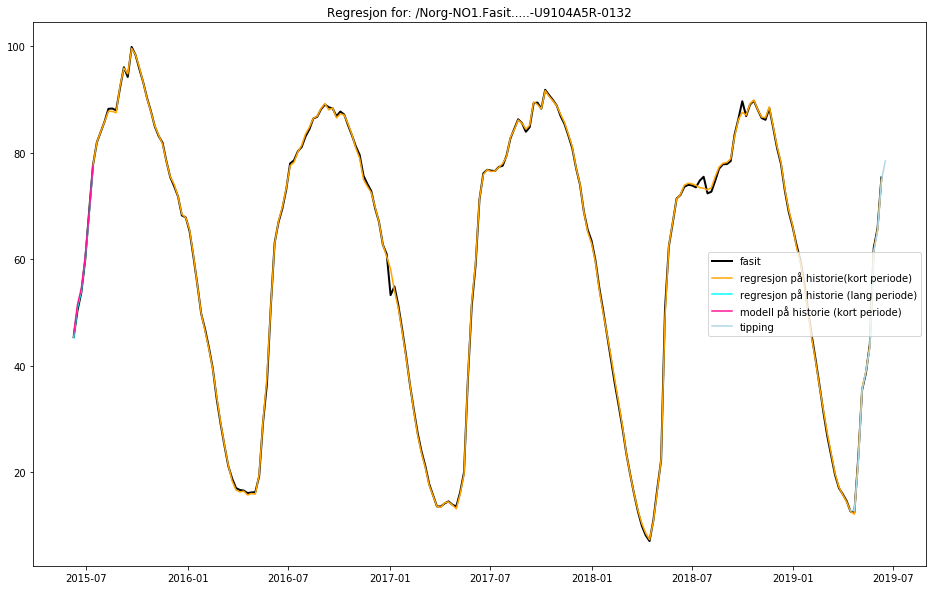

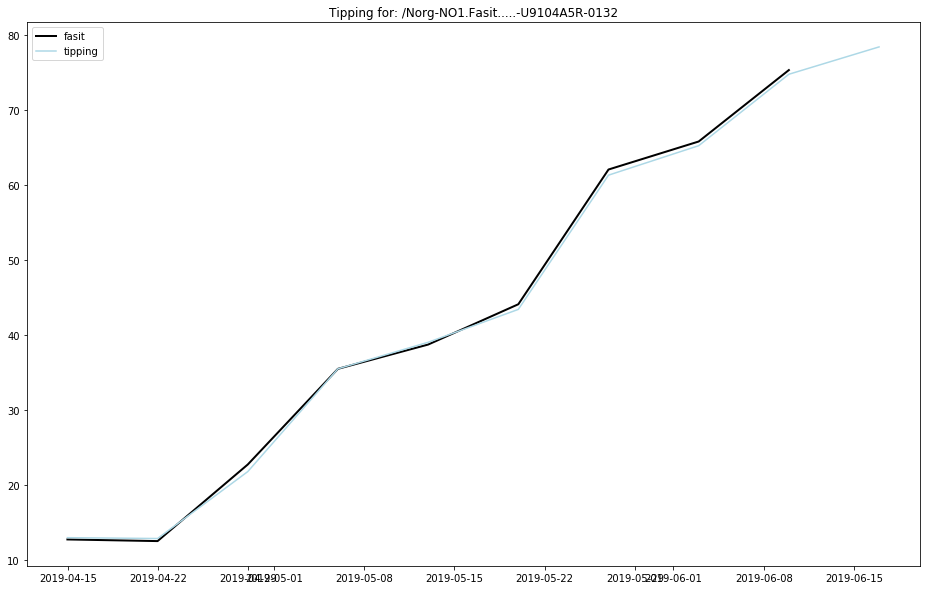

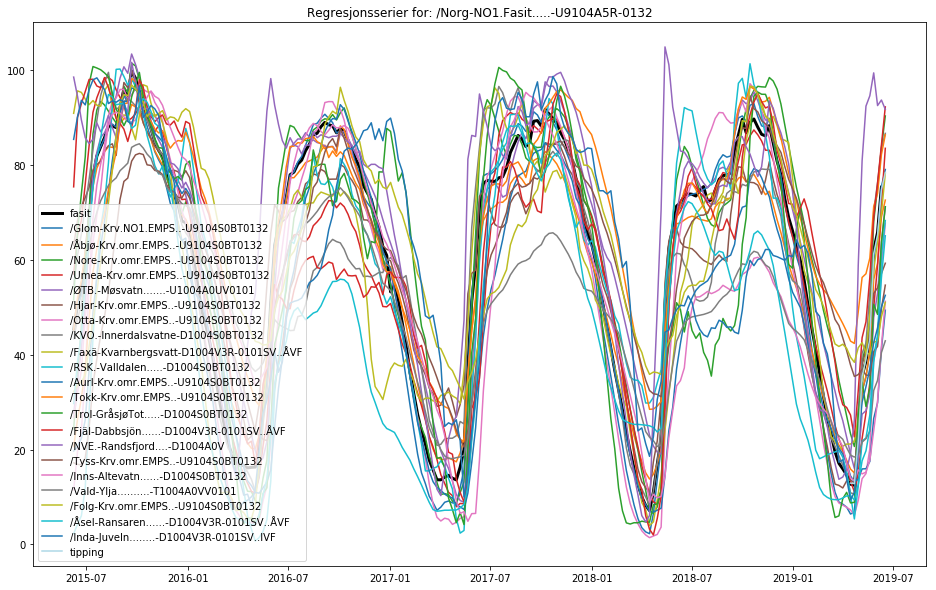



DEFAULT INPUT MAGASIN NO2 :
Antall utvalgte kandidater utifra korrelasjon med fasit (ant_kandidater):  67
Høyeste p-verdi som tas med i sluttmodellen (max_p):  0.025
Antall uker den "korte" regresjonen kjøres (reg_period):  60 


Skriver estimerte verdier til:  RegEstimatMagNO2...-U9104S0BT0132
Skriver formel for siste regresjon til:  RegresjonMagNO2.......-U9104S0BT0132

-----------------------------------------------------------------------
RESULTATER FOR /Norg-NO2.Fasit.....-U9104A5R-0132

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.06.10.
Regresjonsperiode brukt på modellen for siste tipping: 2018.04.16 til: 2019.06.10.
Valgte 67.00 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 22 stk.
Antall stopp av loopen som luker ut for høye p pga minimum antall serier i den lange regresjonen: 0/10
R2 for regresjonen (kort periode): 0.99995
R2 mellom fasit og tipping: 0.99886

Fasit:
 2019-05-20 00:

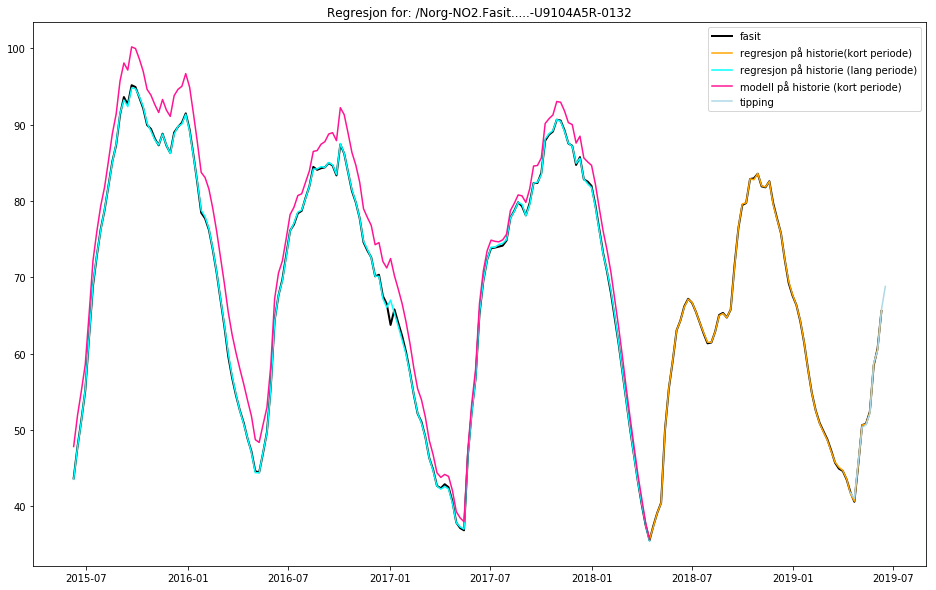

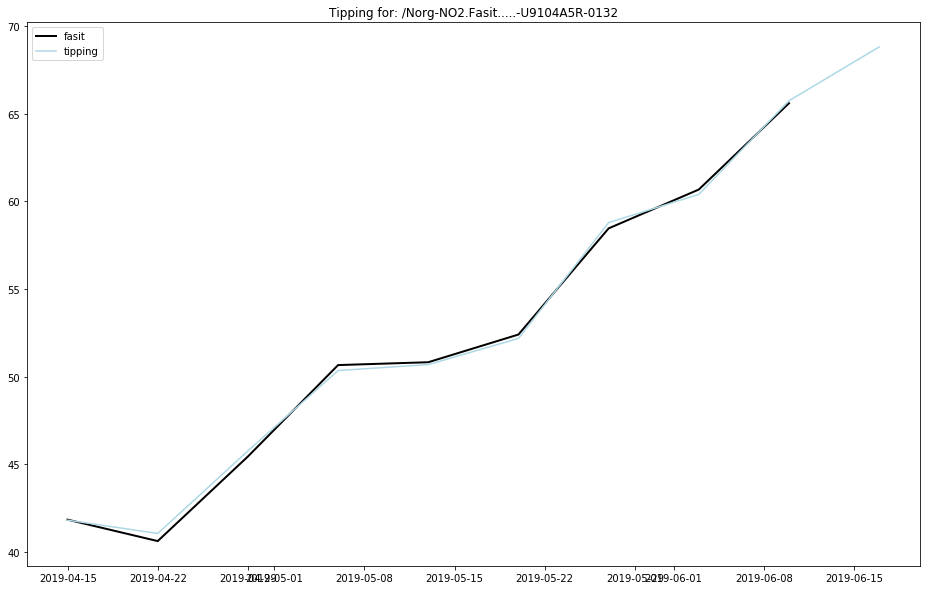

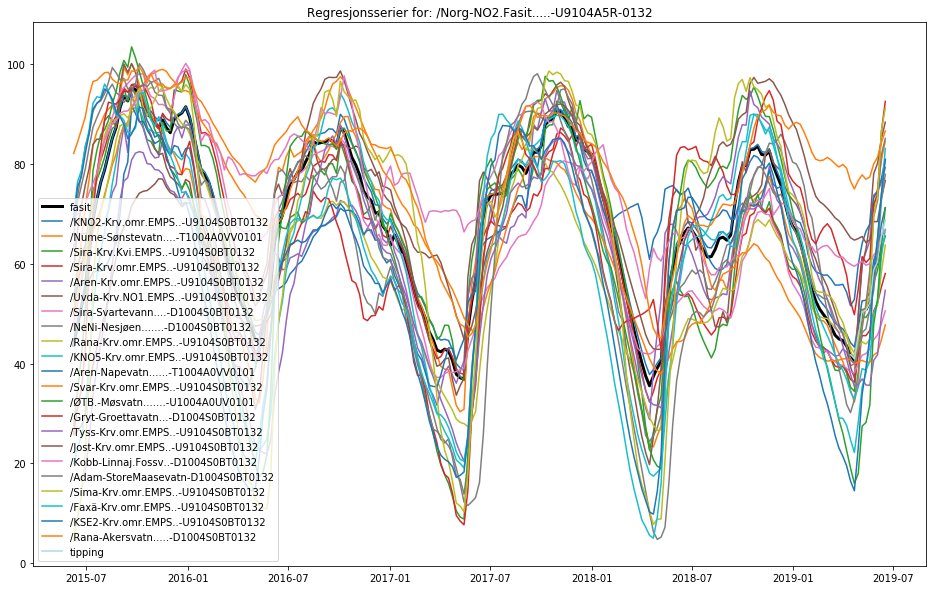



DEFAULT INPUT MAGASIN NO3 :
Antall utvalgte kandidater utifra korrelasjon med fasit (ant_kandidater):  22
Høyeste p-verdi som tas med i sluttmodellen (max_p):  0.025
Antall uker den "korte" regresjonen kjøres (reg_period):  90 


Skriver estimerte verdier til:  RegEstimatMagNO3...-U9104S0BT0132
Skriver formel for siste regresjon til:  RegresjonMagNO3.......-U9104S0BT0132

-----------------------------------------------------------------------
RESULTATER FOR /Norg-NO3.Fasit.....-U9104A5R-0132

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.06.10.
Regresjonsperiode brukt på modellen for siste tipping: 2017.09.18 til: 2019.06.10.
Valgte 22.00 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 14 stk.
Antall stopp av loopen som luker ut for høye p pga minimum antall serier i den lange regresjonen: 0/10
R2 for regresjonen (kort periode): 0.99987
R2 mellom fasit og tipping: 0.99904

Fasit:
 2019-05-20 00:

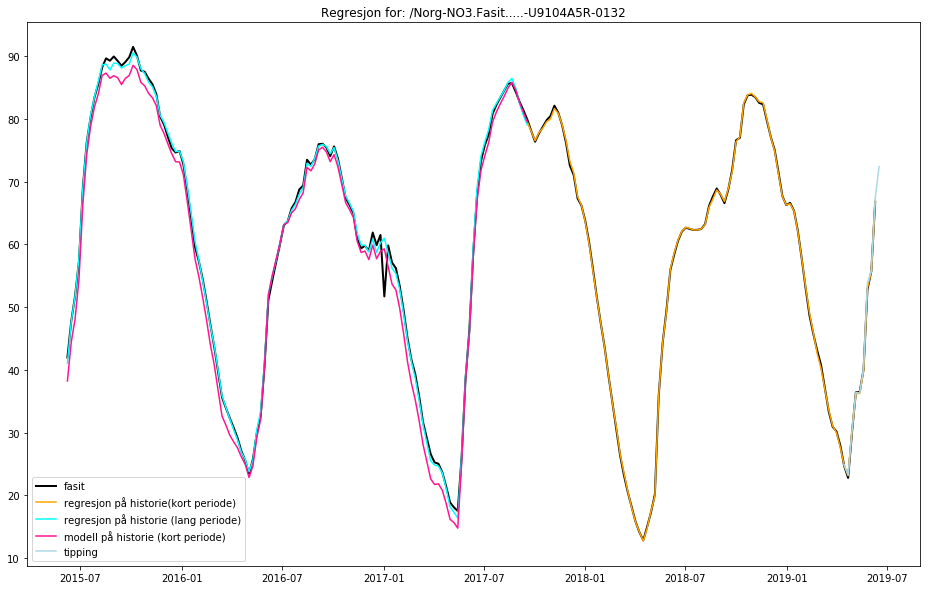

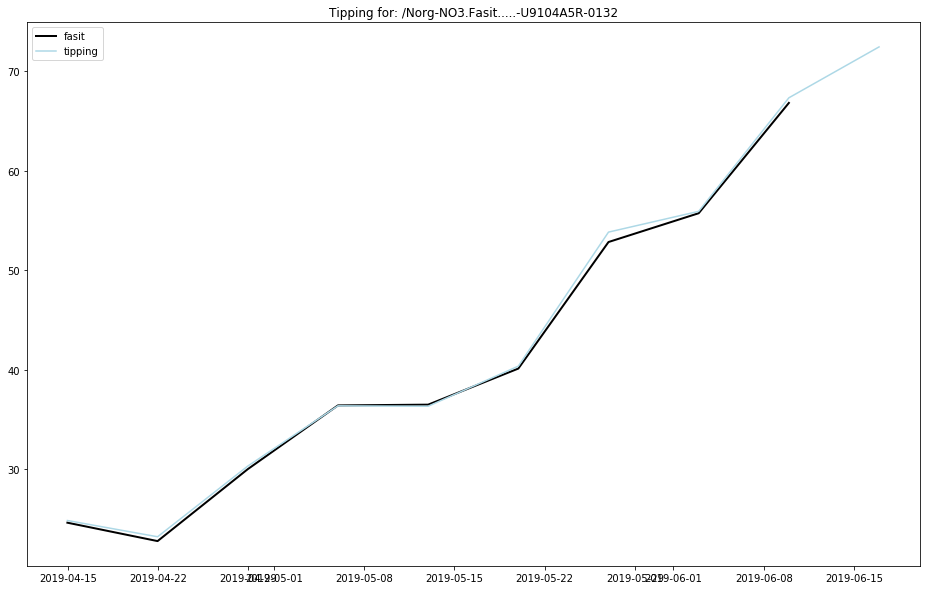

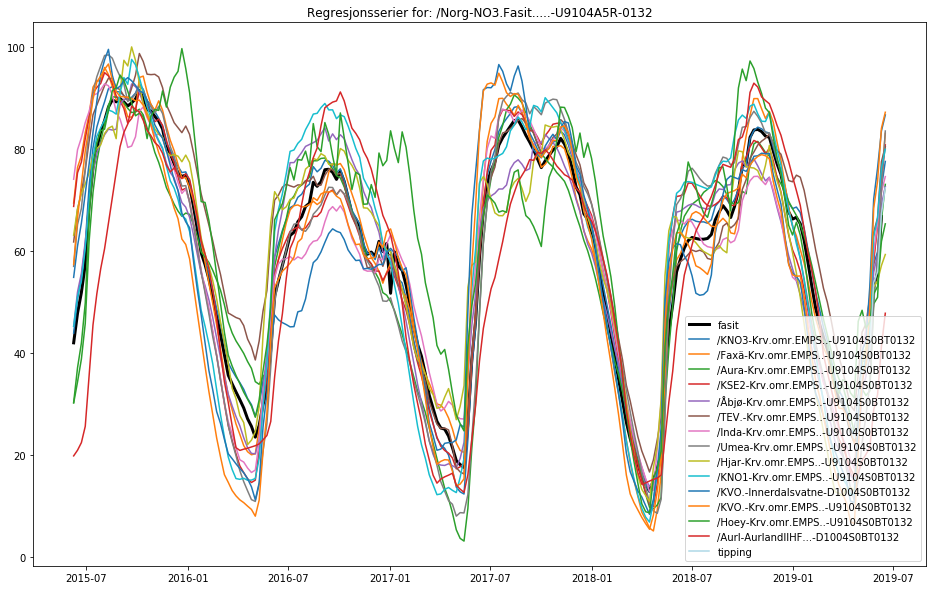



DEFAULT INPUT MAGASIN NO4 :
Antall utvalgte kandidater utifra korrelasjon med fasit (ant_kandidater):  52
Høyeste p-verdi som tas med i sluttmodellen (max_p):  0.025
Antall uker den "korte" regresjonen kjøres (reg_period):  90 


Skriver estimerte verdier til:  RegEstimatMagNO4...-U9104S0BT0132
Skriver formel for siste regresjon til:  RegresjonMagNO4.......-U9104S0BT0132

-----------------------------------------------------------------------
RESULTATER FOR /Norg-NO4.Fasit.....-U9104A5R-0132

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.06.10.
Regresjonsperiode brukt på modellen for siste tipping: 2017.09.18 til: 2019.06.10.
Valgte 52.00 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 23 stk.
Antall stopp av loopen som luker ut for høye p pga minimum antall serier i den lange regresjonen: 0/10
R2 for regresjonen (kort periode): 0.99988
R2 mellom fasit og tipping: 0.99213

Fasit:
 2019-05-20 00:

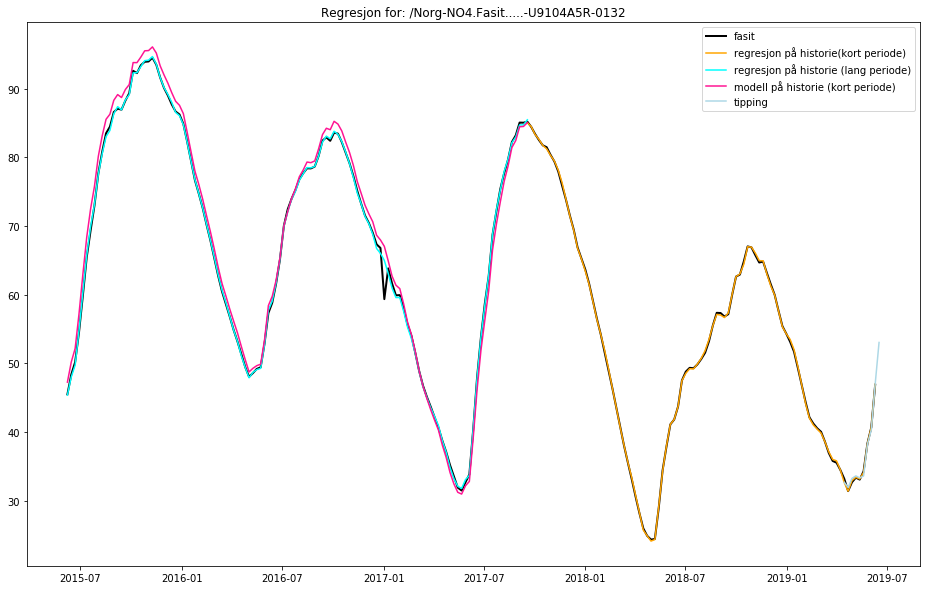

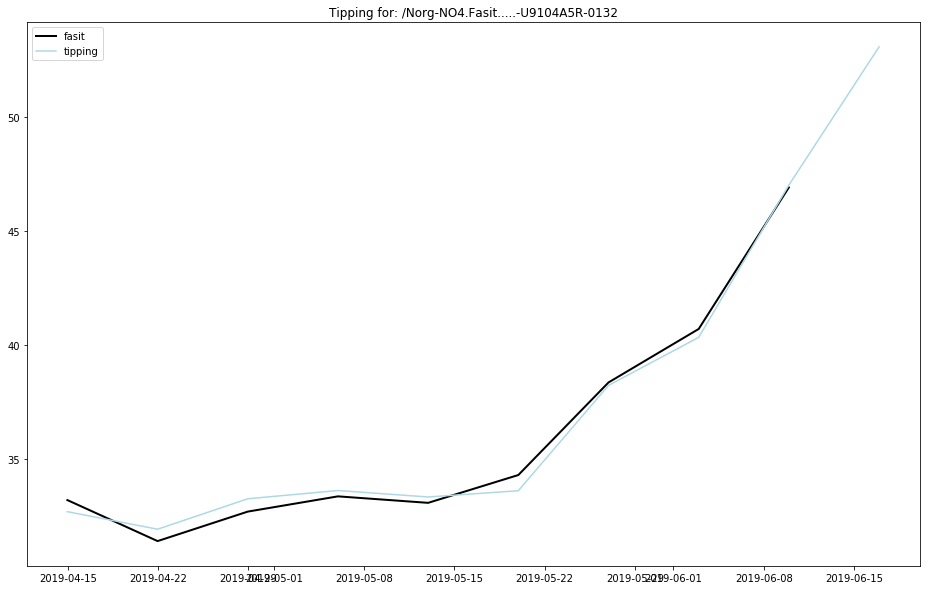

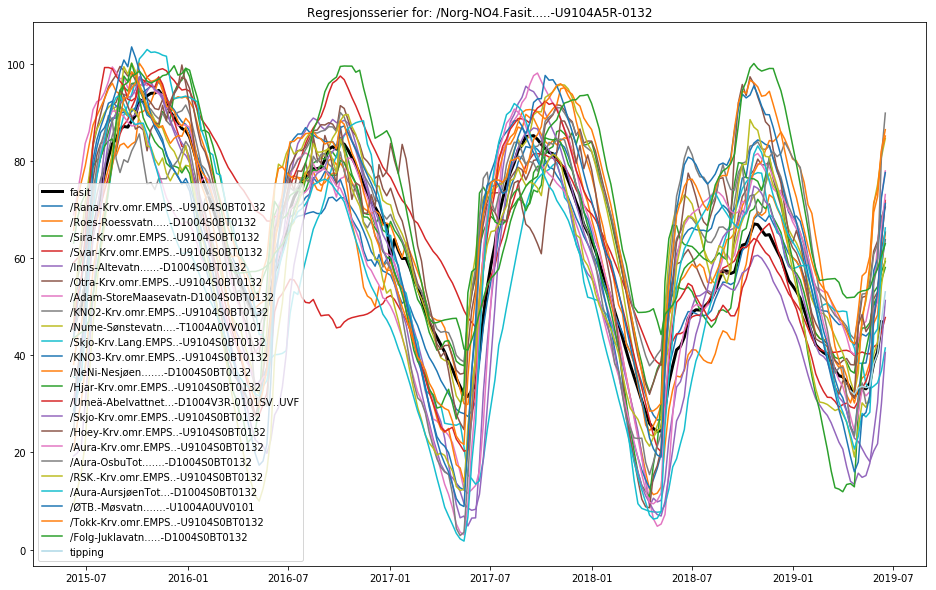



DEFAULT INPUT MAGASIN NO5 :
Antall utvalgte kandidater utifra korrelasjon med fasit (ant_kandidater):  112
Høyeste p-verdi som tas med i sluttmodellen (max_p):  0.025
Antall uker den "korte" regresjonen kjøres (reg_period):  60 


Skriver estimerte verdier til:  RegEstimatMagNO5...-U9104S0BT0132
Skriver formel for siste regresjon til:  RegresjonMagNO5.......-U9104S0BT0132

-----------------------------------------------------------------------
RESULTATER FOR /Norg-NO5.Fasit.....-U9104A5R-0132

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.06.10.
Regresjonsperiode brukt på modellen for siste tipping: 2018.04.16 til: 2019.06.10.
Valgte 112.00 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 24 stk.
Antall stopp av loopen som luker ut for høye p pga minimum antall serier i den lange regresjonen: 0/10
R2 for regresjonen (kort periode): 0.99993
R2 mellom fasit og tipping: 0.99395

Fasit:
 2019-05-20 0

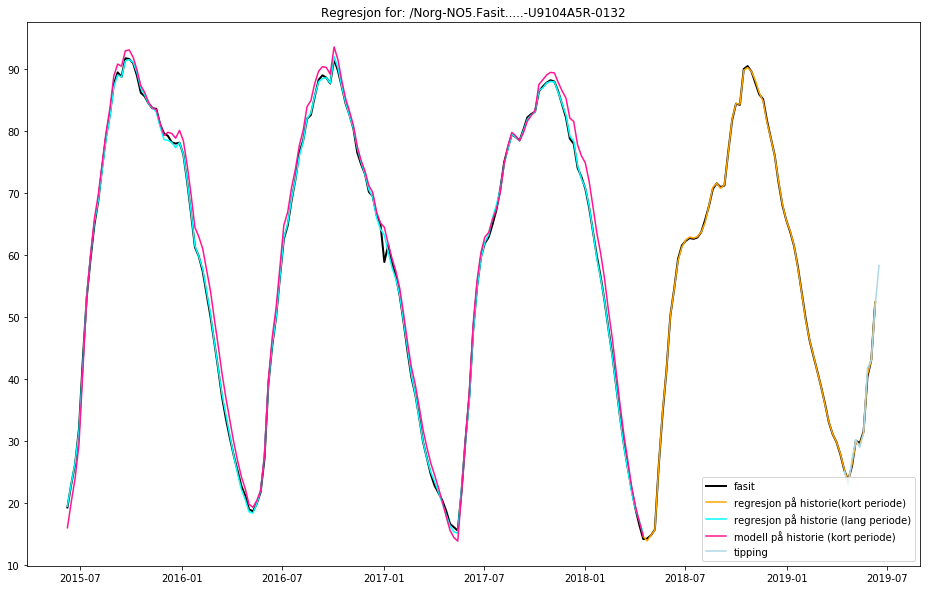

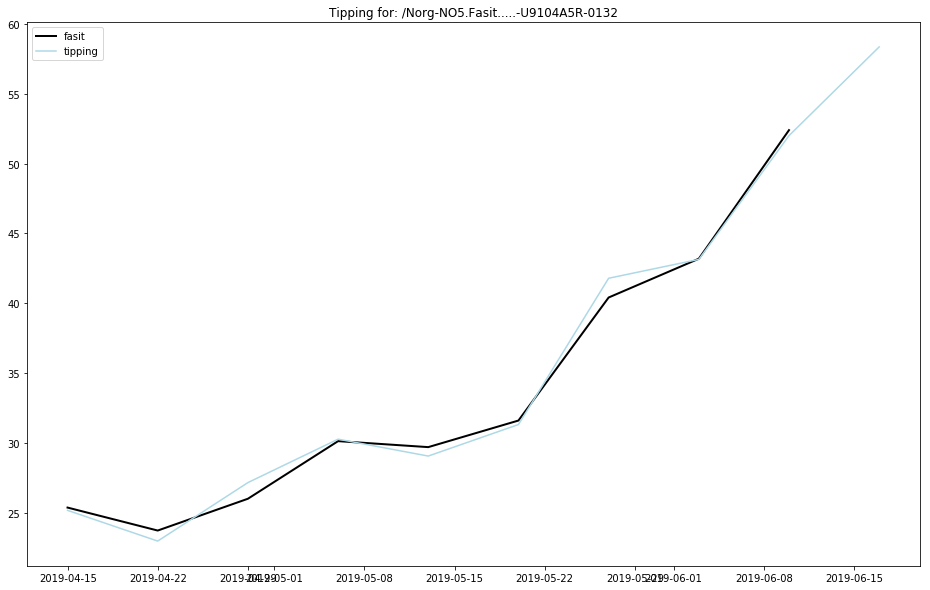

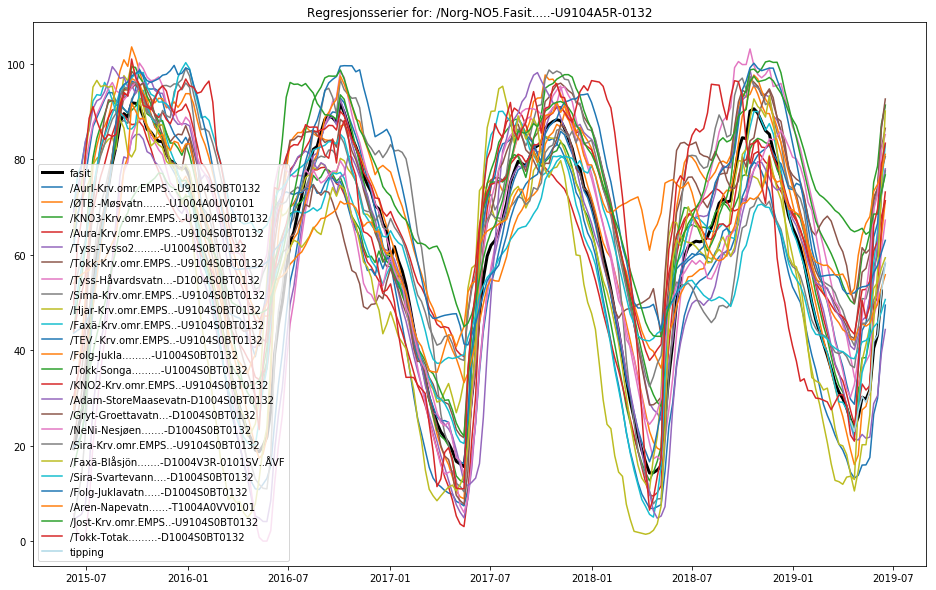



DEFAULT INPUT MAGASIN SE1 :
Antall utvalgte kandidater utifra korrelasjon med fasit (ant_kandidater):  90
Høyeste p-verdi som tas med i sluttmodellen (max_p):  0.025
Antall uker den "korte" regresjonen kjøres (reg_period):  90 


Skriver estimerte verdier til:  RegEstimatMagSE1...-U9104S0BT0132
Skriver formel for siste regresjon til:  RegresjonMagSE1.......-U9104S0BT0132

-----------------------------------------------------------------------
RESULTATER FOR /Sver-SE1.Fasit.....-U9104A5R-0132

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.06.10.
Regresjonsperiode brukt på modellen for siste tipping: 2017.09.18 til: 2019.06.10.
Valgte 90.00 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 24 stk.
Antall stopp av loopen som luker ut for høye p pga minimum antall serier i den lange regresjonen: 0/10
R2 for regresjonen (kort periode): 0.99977
R2 mellom fasit og tipping: 0.97298

Fasit:
 2019-05-20 00:

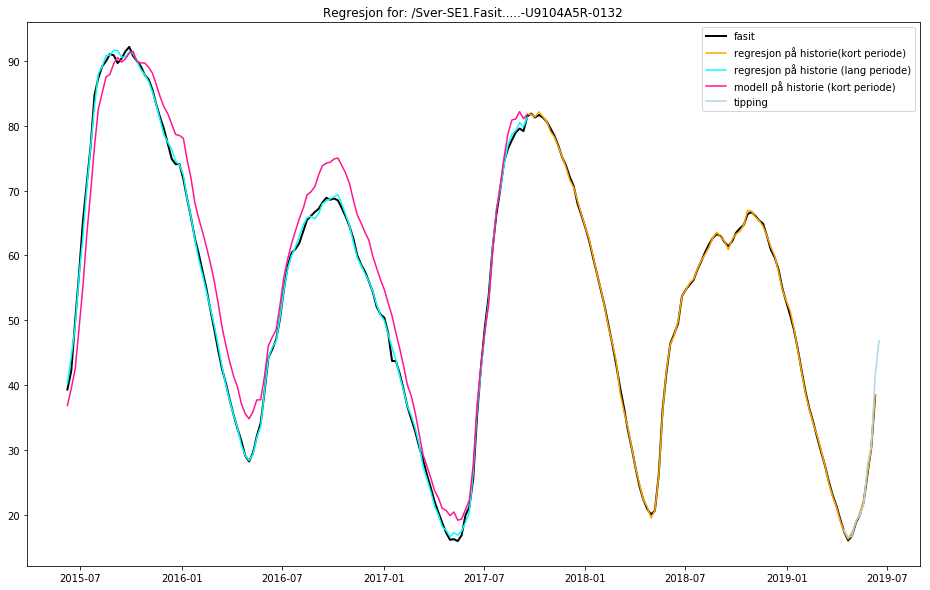

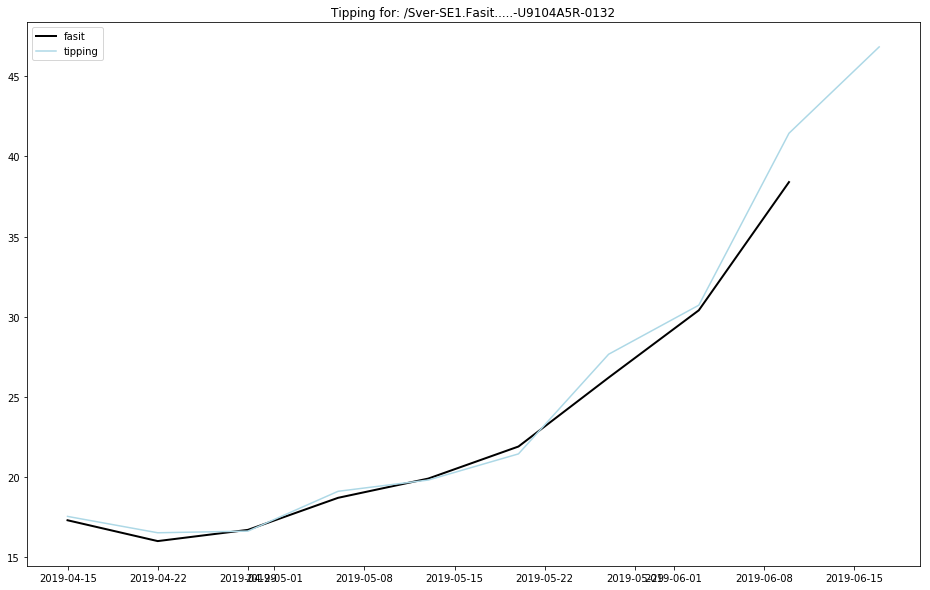

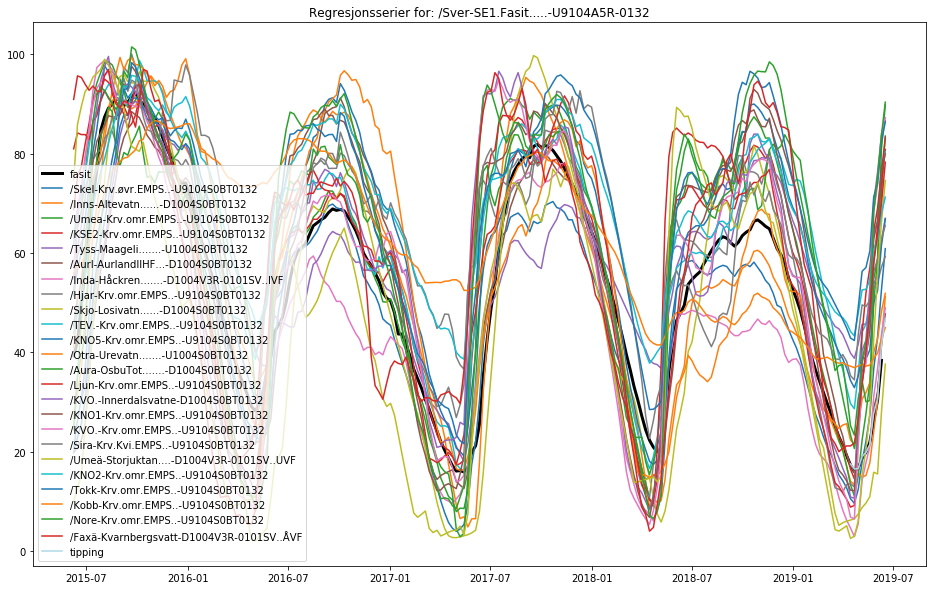



DEFAULT INPUT MAGASIN SE2 :
Antall utvalgte kandidater utifra korrelasjon med fasit (ant_kandidater):  61
Høyeste p-verdi som tas med i sluttmodellen (max_p):  0.025
Antall uker den "korte" regresjonen kjøres (reg_period):  60 


Skriver estimerte verdier til:  RegEstimatMagSE2...-U9104S0BT0132
Skriver formel for siste regresjon til:  RegresjonMagSE2.......-U9104S0BT0132

-----------------------------------------------------------------------
RESULTATER FOR /Sver-SE2.Fasit.....-U9104A5R-0132

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.06.10.
Regresjonsperiode brukt på modellen for siste tipping: 2018.04.16 til: 2019.06.10.
Valgte 61.00 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 22 stk.
Antall stopp av loopen som luker ut for høye p pga minimum antall serier i den lange regresjonen: 0/10
R2 for regresjonen (kort periode): 0.99995
R2 mellom fasit og tipping: 0.99979

Fasit:
 2019-05-20 00:

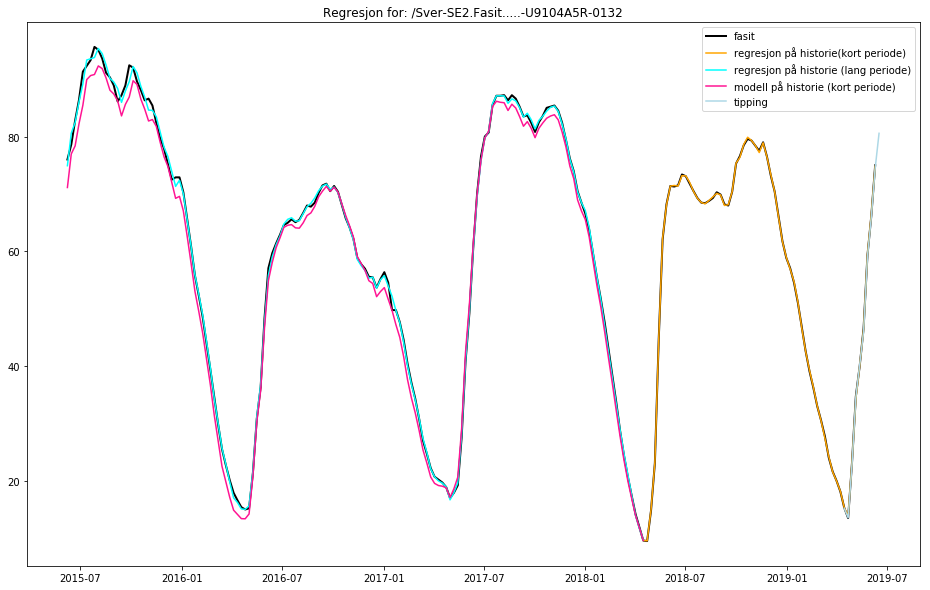

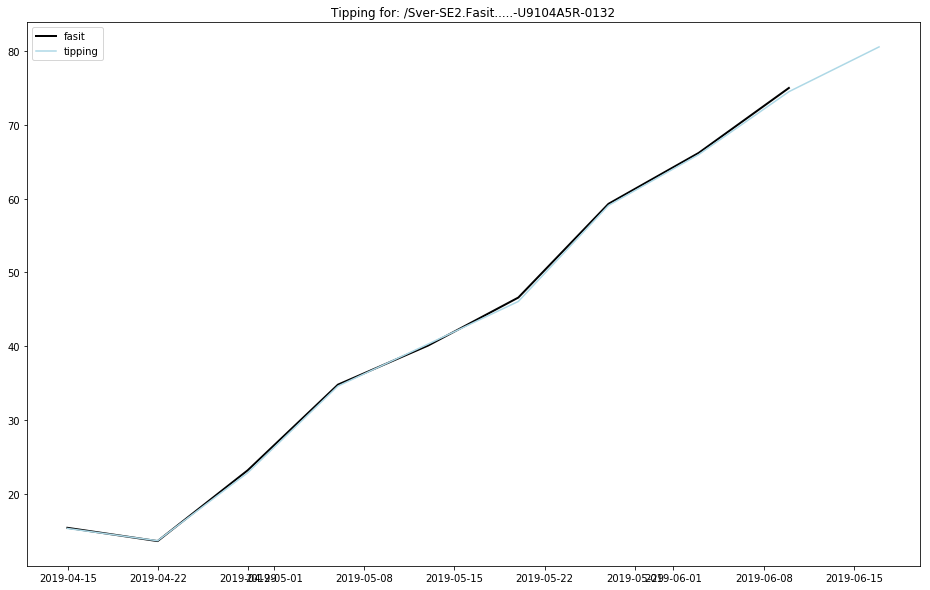

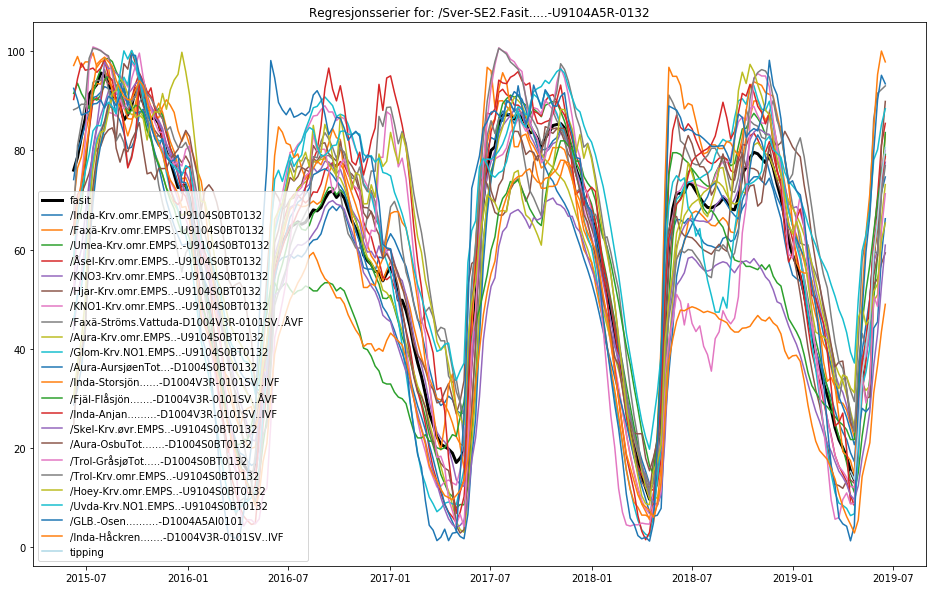



DEFAULT INPUT MAGASIN SE3 :
Antall utvalgte kandidater utifra korrelasjon med fasit (ant_kandidater):  120
Høyeste p-verdi som tas med i sluttmodellen (max_p):  0.025
Antall uker den "korte" regresjonen kjøres (reg_period):  150 


Skriver estimerte verdier til:  RegEstimatMagSE3...-U9104S0BT0132
Skriver formel for siste regresjon til:  RegresjonMagSE3.......-U9104S0BT0132

-----------------------------------------------------------------------
RESULTATER FOR /Sver-SE3.Fasit.....-U9104A5R-0132

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.06.10.
Regresjonsperiode brukt på modellen for siste tipping: 2016.07.25 til: 2019.06.10.
Valgte 120.00 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 23 stk.
Antall stopp av loopen som luker ut for høye p pga minimum antall serier i den lange regresjonen: 0/10
R2 for regresjonen (kort periode): 0.99624
R2 mellom fasit og tipping: 0.98779

Fasit:
 2019-05-20 

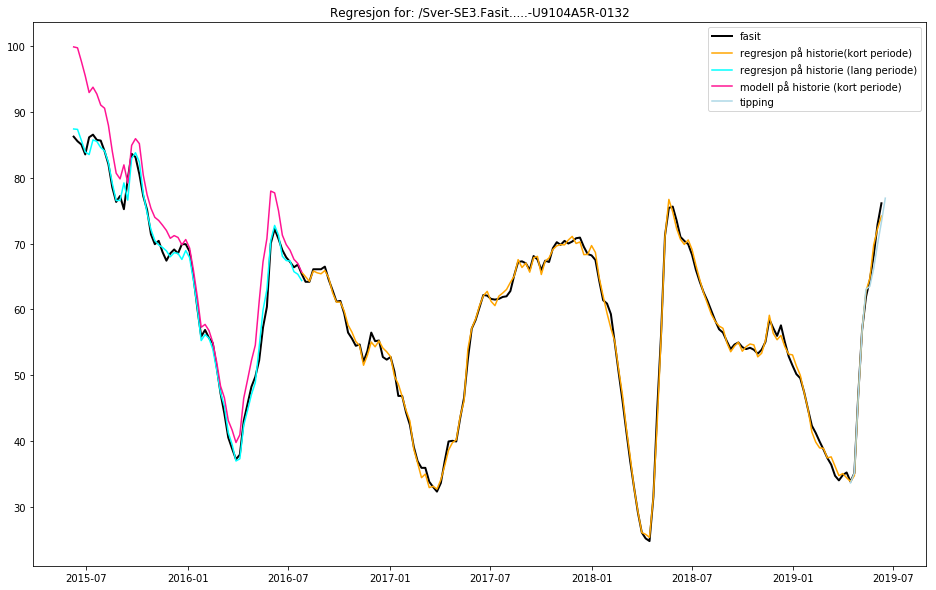

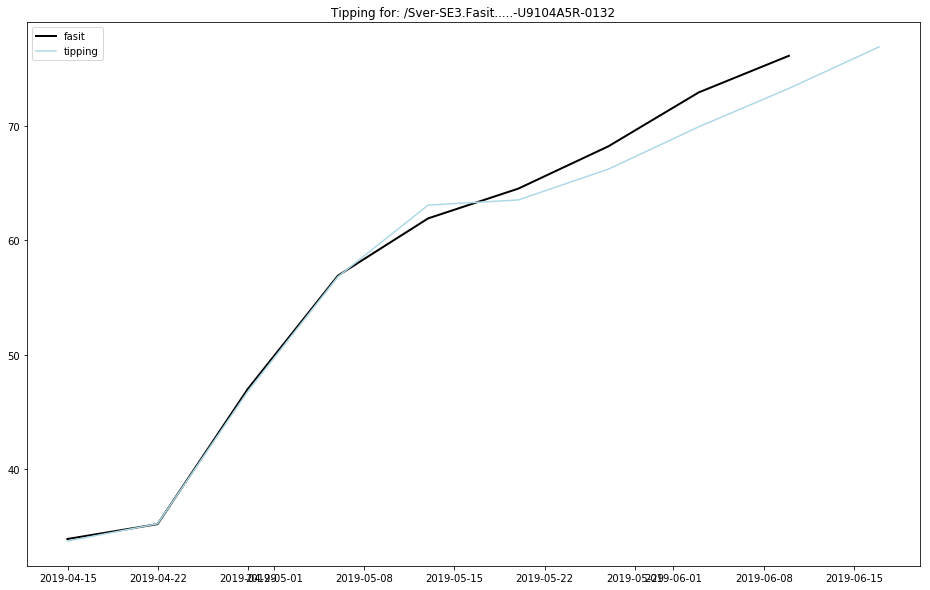

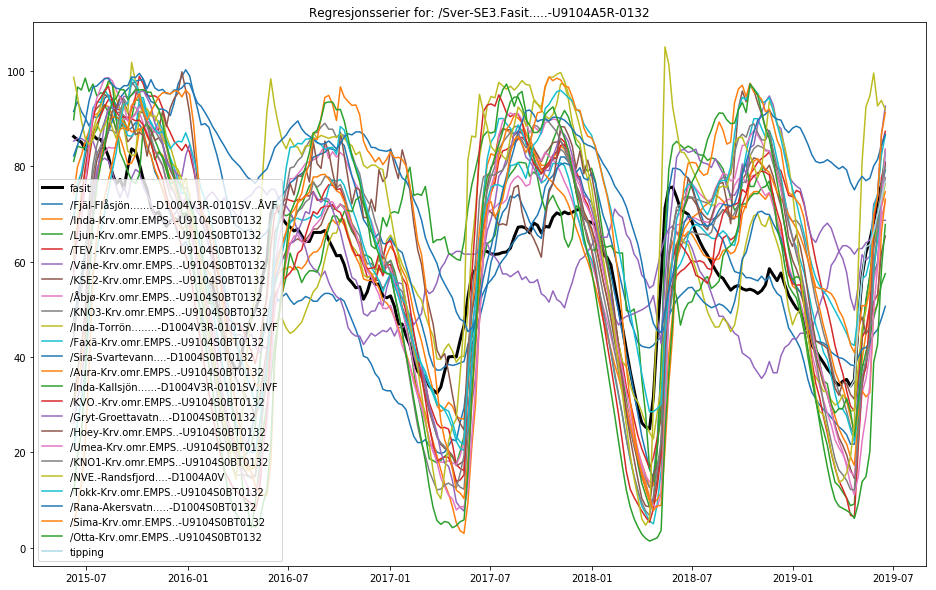



DEFAULT INPUT MAGASIN SE4 :
Antall utvalgte kandidater utifra korrelasjon med fasit (ant_kandidater):  67
Høyeste p-verdi som tas med i sluttmodellen (max_p):  0.025
Antall uker den "korte" regresjonen kjøres (reg_period):  204 


Skriver estimerte verdier til:  RegEstimatMagSE4...-U9104S0BT0132
Skriver formel for siste regresjon til:  RegresjonMagSE4.......-U9104S0BT0132

-----------------------------------------------------------------------
RESULTATER FOR /Sver-SE4.Fasit.....-U9104A5R-0132

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.06.10.
Regresjonsperiode brukt på modellen for siste tipping: 2015.07.13 til: 2019.06.10.
Valgte 67.00 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 24 stk.
Antall stopp av loopen som luker ut for høye p pga minimum antall serier i den lange regresjonen: 0/10
R2 for regresjonen (kort periode): 0.99568
R2 mellom fasit og tipping: 0.68621

Fasit:
 2019-05-20 00

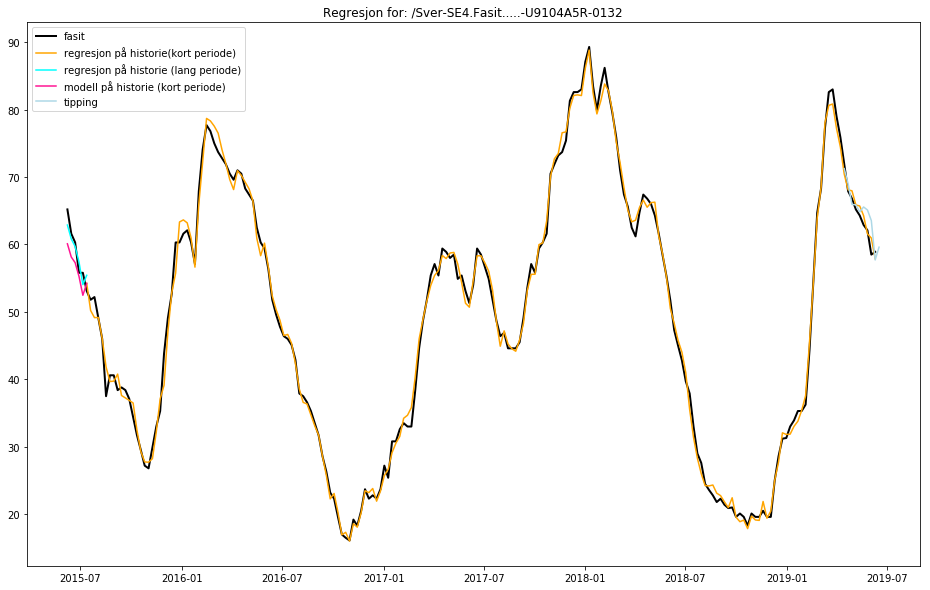

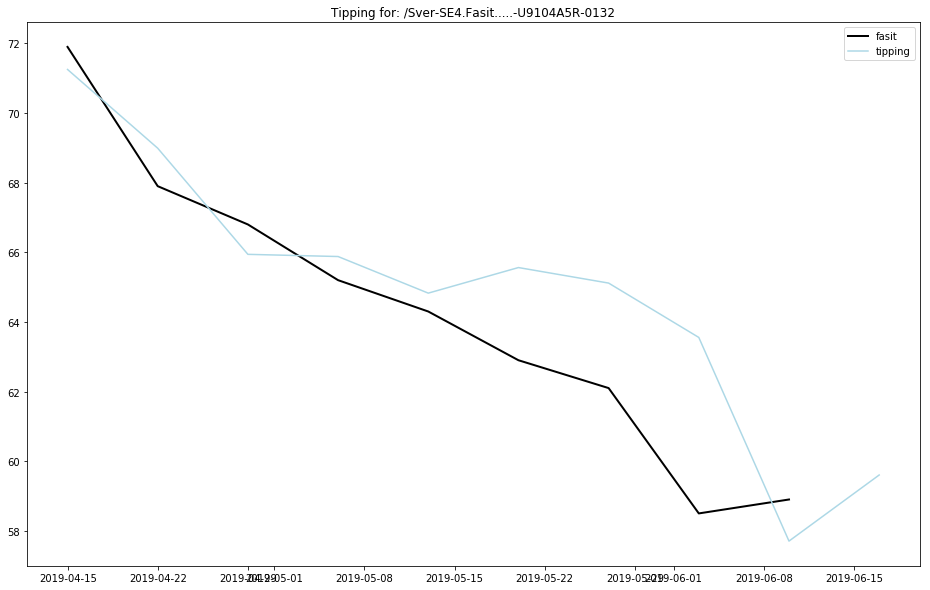

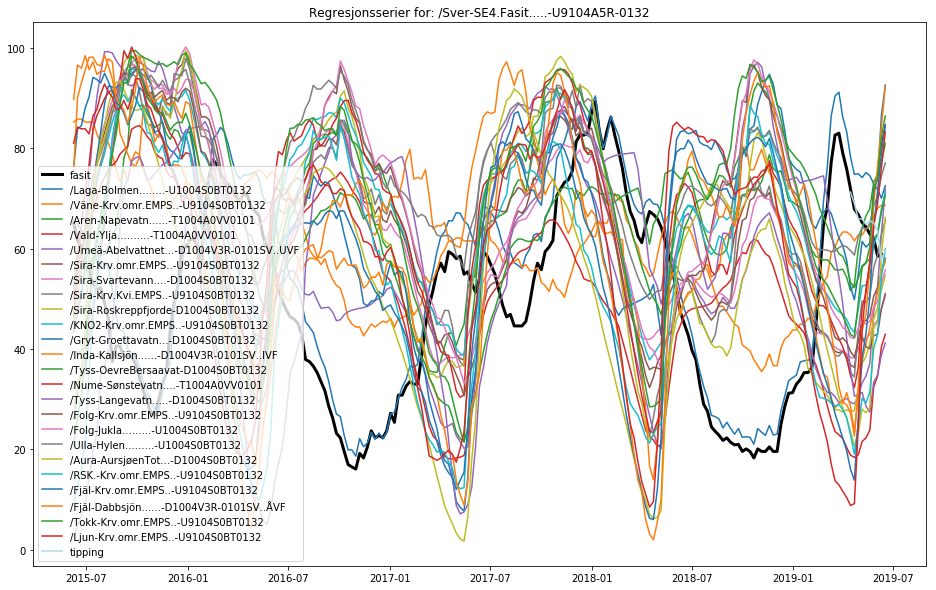



DEFAULT INPUT MAGASIN NO1 :
Antall utvalgte kandidater utifra korrelasjon med fasit (ant_kandidater):  140
Høyeste p-verdi som tas med i sluttmodellen (max_p):  0.025
Antall uker den "korte" regresjonen kjøres (reg_period):  120 


Skriver estimerte verdier til:  RegEstimatTilsigNO1-U9100S0BT0105
Skriver formel for siste regresjon til:  RegresjonTilsigNO1.-U9100S0BT0105

-----------------------------------------------------------------------
RESULTATER FOR /Norg-No1.Fasit.....-U9100S0BT0105

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.06.03.
Regresjonsperiode brukt på modellen for siste tipping: 2017.02.13 til: 2019.06.03.
Valgte 140.00 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 18 stk.
Antall stopp av loopen som luker ut for høye p pga minimum antall serier i den lange regresjonen: 0/10
R2 for regresjonen (kort periode): 0.99335
R2 mellom fasit og tipping: 0.99513

Fasit:
 2019-05-13 00:

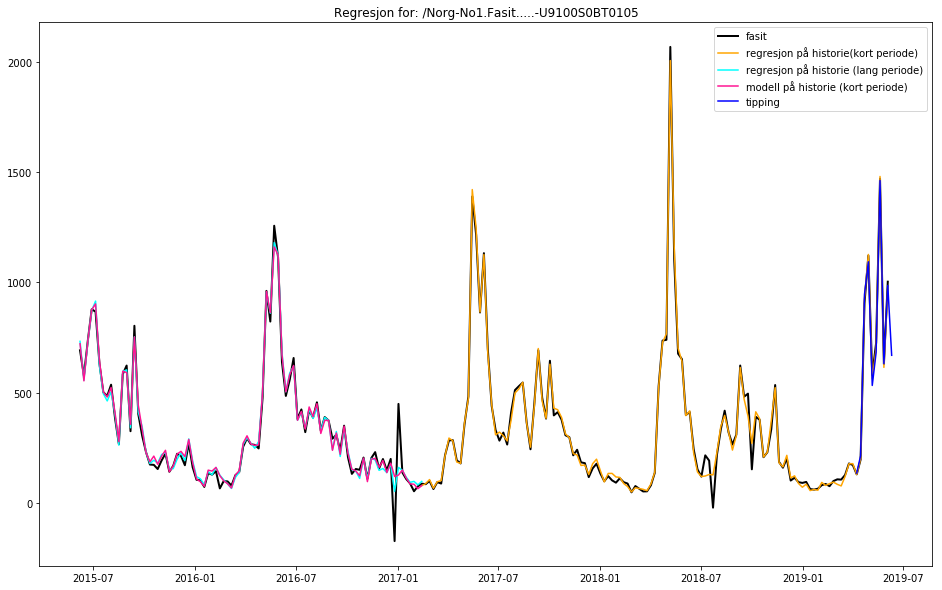

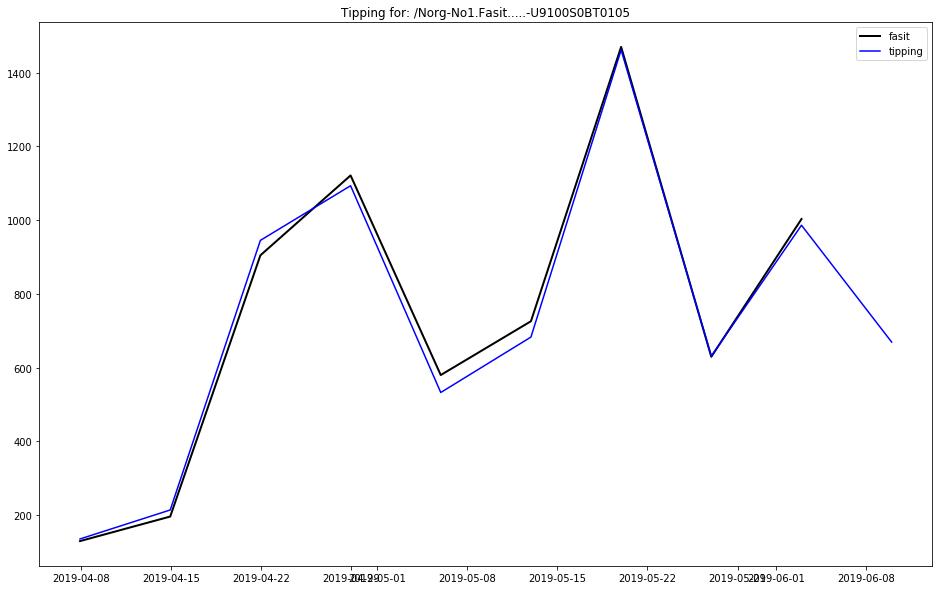

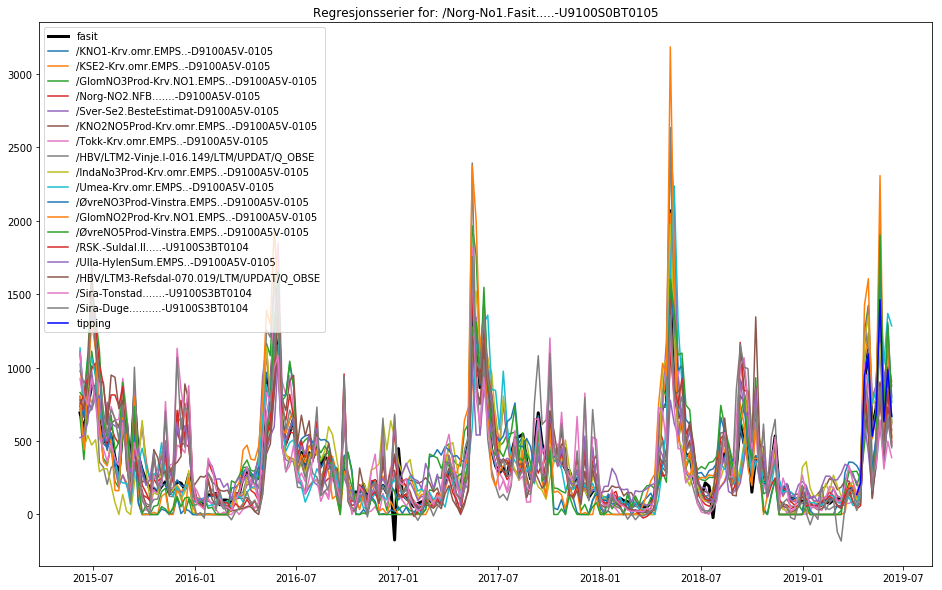



DEFAULT INPUT MAGASIN NO2 :
Antall utvalgte kandidater utifra korrelasjon med fasit (ant_kandidater):  60
Høyeste p-verdi som tas med i sluttmodellen (max_p):  0.025
Antall uker den "korte" regresjonen kjøres (reg_period):  120 


Skriver estimerte verdier til:  RegEstimatTilsigNO2-U9100S0BT0105
Skriver formel for siste regresjon til:  RegresjonTilsigNO2.-U9100S0BT0105

-----------------------------------------------------------------------
RESULTATER FOR /Norg-No2.Fasit.....-U9100S0BT0105

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.06.03.
Regresjonsperiode brukt på modellen for siste tipping: 2017.02.13 til: 2019.06.03.
Valgte 60.00 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 6 stk.
Antall stopp av loopen som luker ut for høye p pga minimum antall serier i den lange regresjonen: 0/10
R2 for regresjonen (kort periode): 0.99518
R2 mellom fasit og tipping: 0.98650

Fasit:
 2019-05-13 00:00:

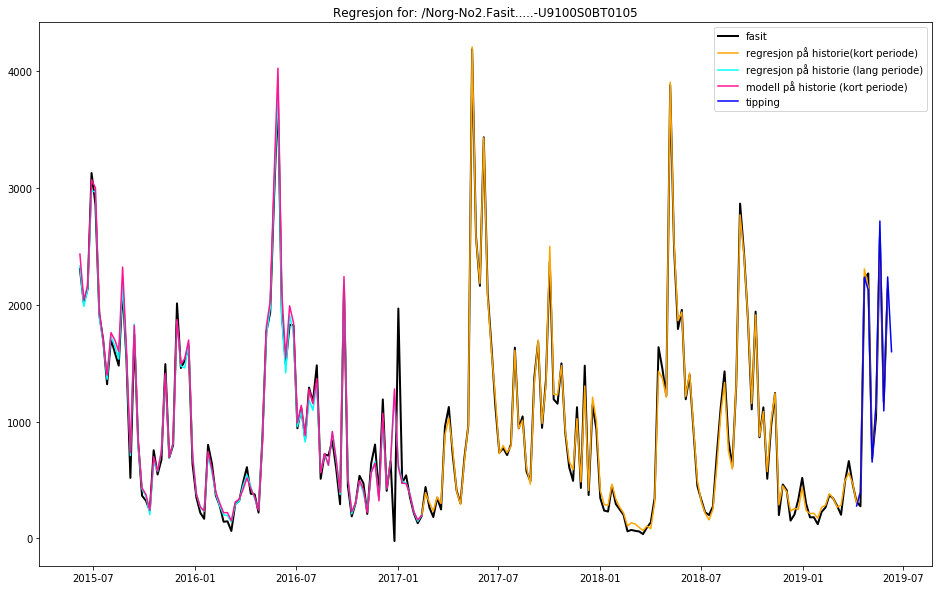

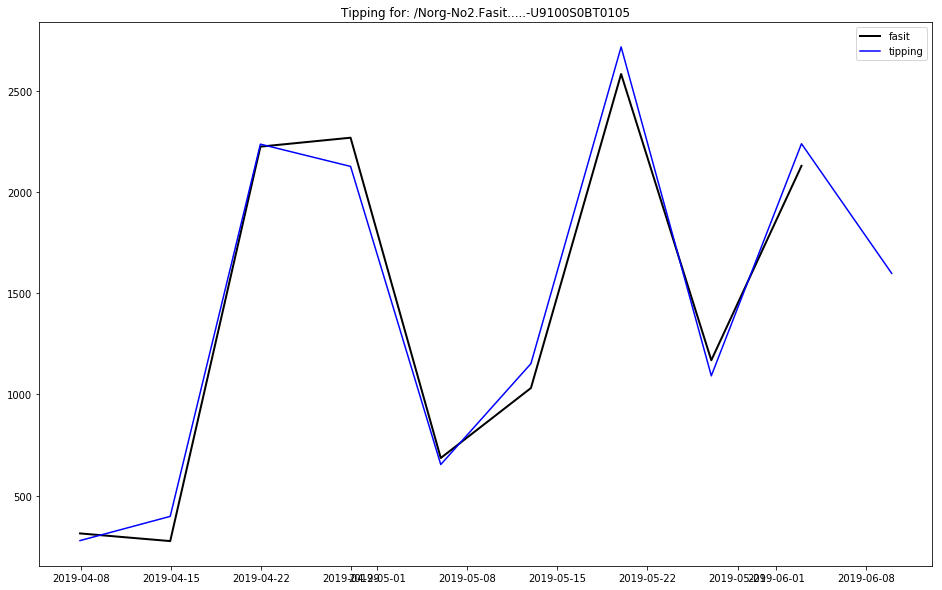

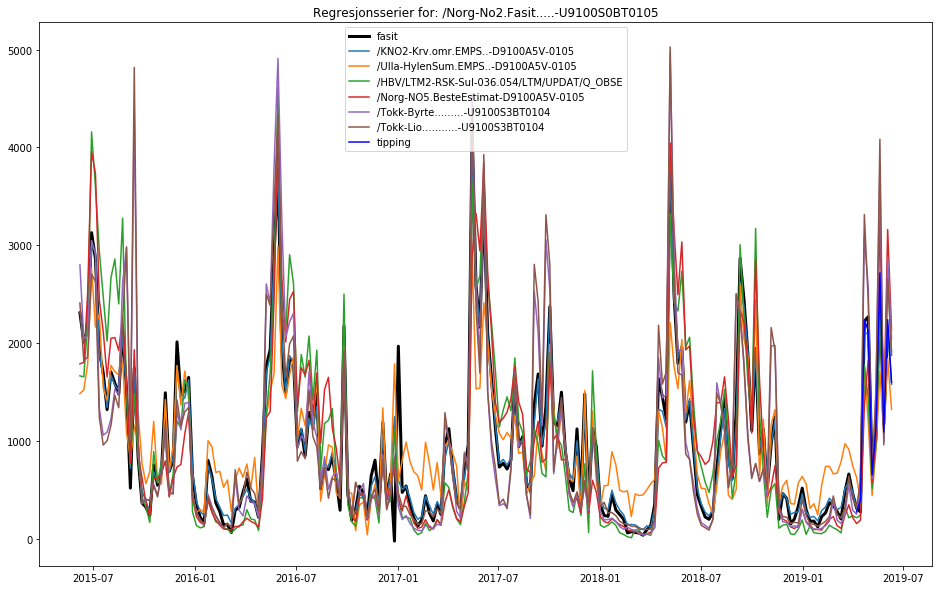



DEFAULT INPUT MAGASIN NO3 :
Antall utvalgte kandidater utifra korrelasjon med fasit (ant_kandidater):  70
Høyeste p-verdi som tas med i sluttmodellen (max_p):  0.025
Antall uker den "korte" regresjonen kjøres (reg_period):  120 


Skriver estimerte verdier til:  RegEstimatTilsigNO3-U9100S0BT0105
Skriver formel for siste regresjon til:  RegresjonTilsigNO3.-U9100S0BT0105

-----------------------------------------------------------------------
RESULTATER FOR /Norg-No3.Fasit.....-U9100S0BT0105

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.06.03.
Regresjonsperiode brukt på modellen for siste tipping: 2017.02.13 til: 2019.06.03.
Valgte 70.00 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 2 stk.
Antall stopp av loopen som luker ut for høye p pga minimum antall serier i den lange regresjonen: 0/10
R2 for regresjonen (kort periode): 0.99207
R2 mellom fasit og tipping: 0.99477

Fasit:
 2019-05-13 00:00:

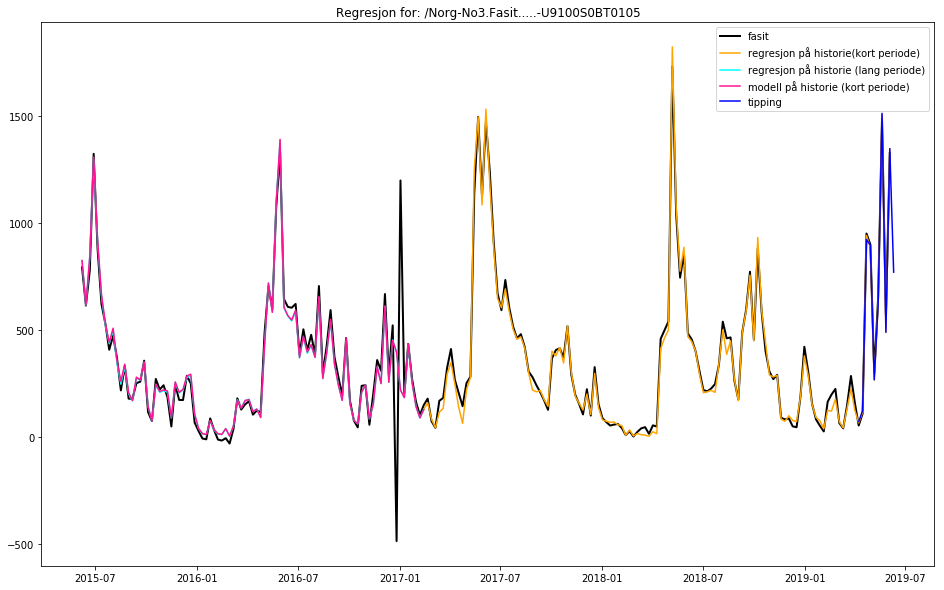

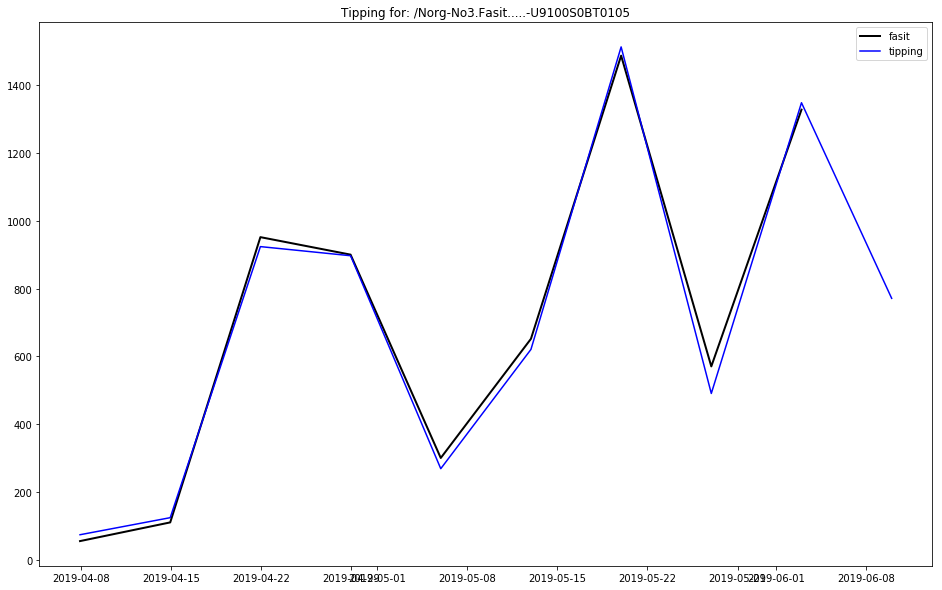

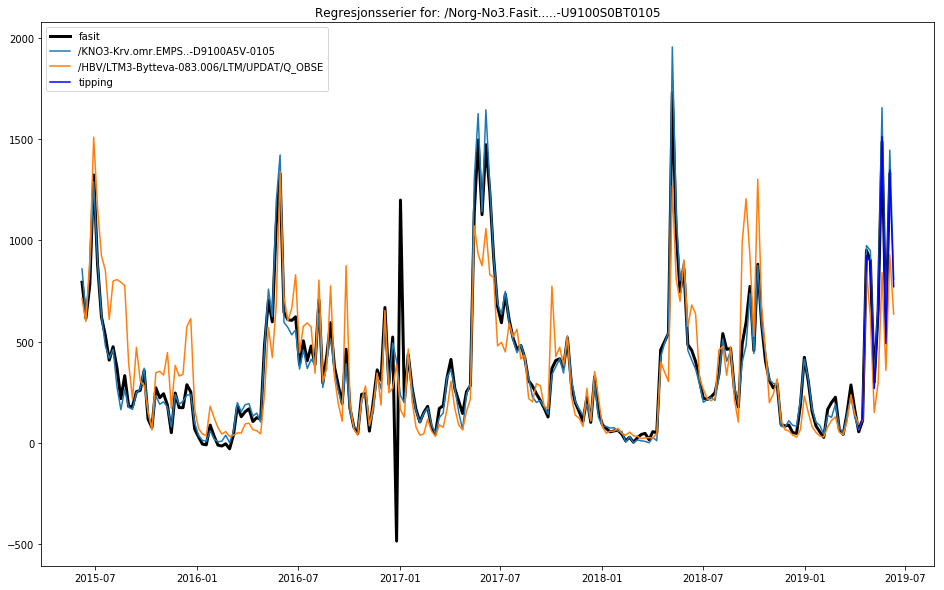



DEFAULT INPUT MAGASIN NO4 :
Antall utvalgte kandidater utifra korrelasjon med fasit (ant_kandidater):  54
Høyeste p-verdi som tas med i sluttmodellen (max_p):  0.025
Antall uker den "korte" regresjonen kjøres (reg_period):  120 


Skriver estimerte verdier til:  RegEstimatTilsigNO4-U9100S0BT0105
Skriver formel for siste regresjon til:  RegresjonTilsigNO4.-U9100S0BT0105

-----------------------------------------------------------------------
RESULTATER FOR /Norg-No4.Fasit.....-U9100S0BT0105

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.06.03.
Regresjonsperiode brukt på modellen for siste tipping: 2017.02.13 til: 2019.06.03.
Valgte 54.00 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 3 stk.
Antall stopp av loopen som luker ut for høye p pga minimum antall serier i den lange regresjonen: 0/10
R2 for regresjonen (kort periode): 0.99282
R2 mellom fasit og tipping: 0.97433

Fasit:
 2019-05-13 00:00:

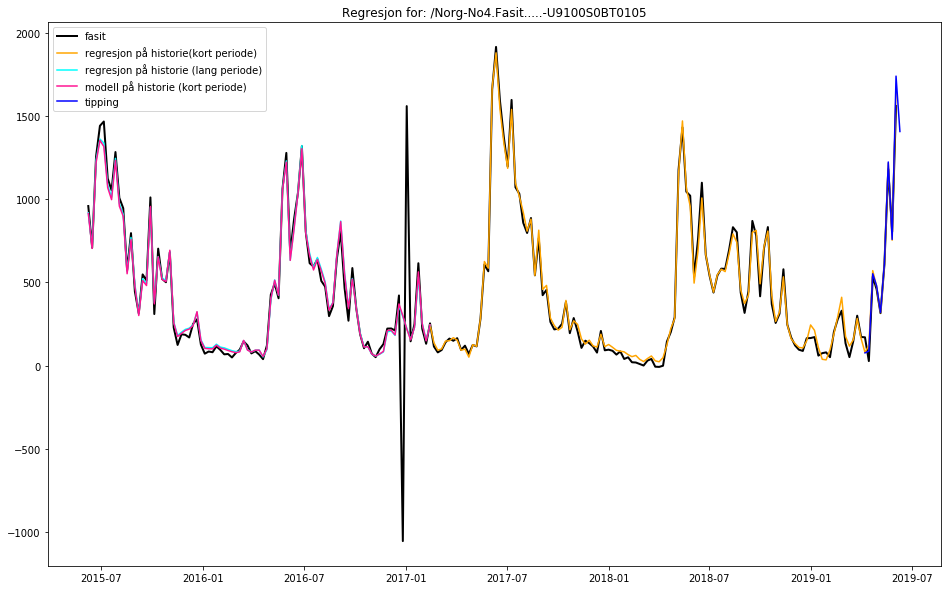

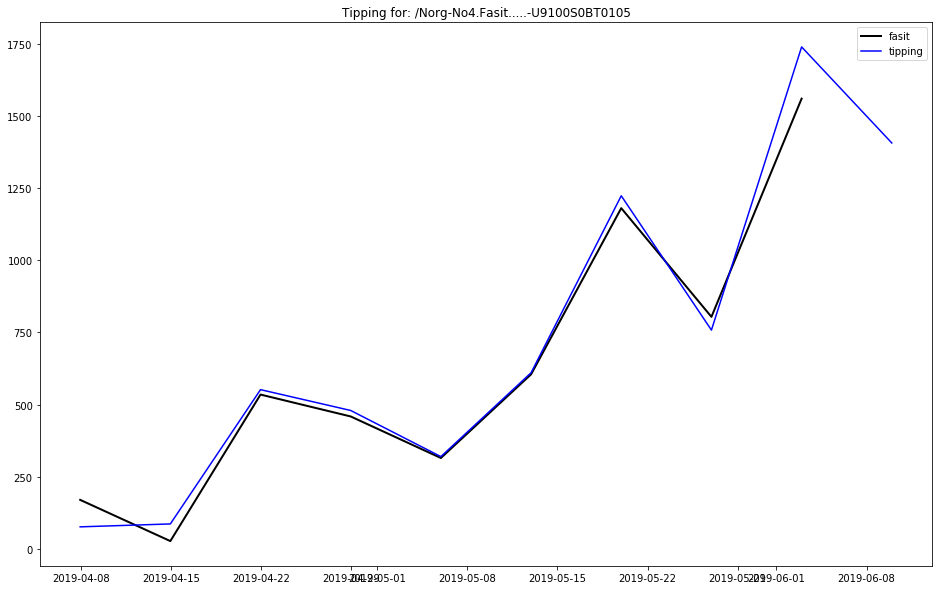

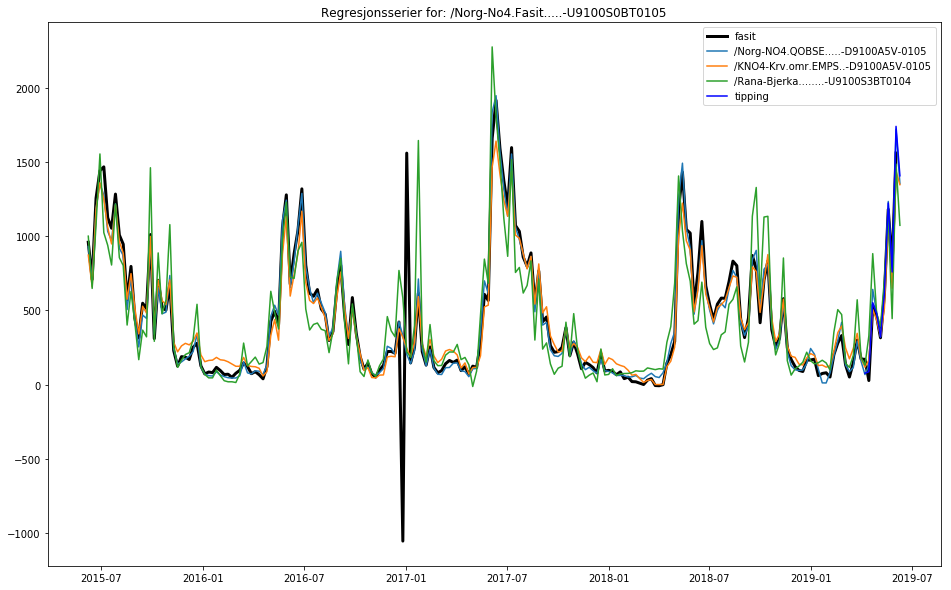



DEFAULT INPUT MAGASIN NO5 :
Antall utvalgte kandidater utifra korrelasjon med fasit (ant_kandidater):  135
Høyeste p-verdi som tas med i sluttmodellen (max_p):  0.025
Antall uker den "korte" regresjonen kjøres (reg_period):  60 


Skriver estimerte verdier til:  RegEstimatTilsigNO5-U9100S0BT0105
Skriver formel for siste regresjon til:  RegresjonTilsigNO5.-U9100S0BT0105

-----------------------------------------------------------------------
RESULTATER FOR /Norg-No5.Fasit.....-U9100S0BT0105

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.06.03.
Regresjonsperiode brukt på modellen for siste tipping: 2018.04.09 til: 2019.06.03.
Valgte 135.00 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 14 stk.
Antall stopp av loopen som luker ut for høye p pga minimum antall serier i den lange regresjonen: 0/10
R2 for regresjonen (kort periode): 0.99597
R2 mellom fasit og tipping: 0.98786

Fasit:
 2019-05-13 00:0

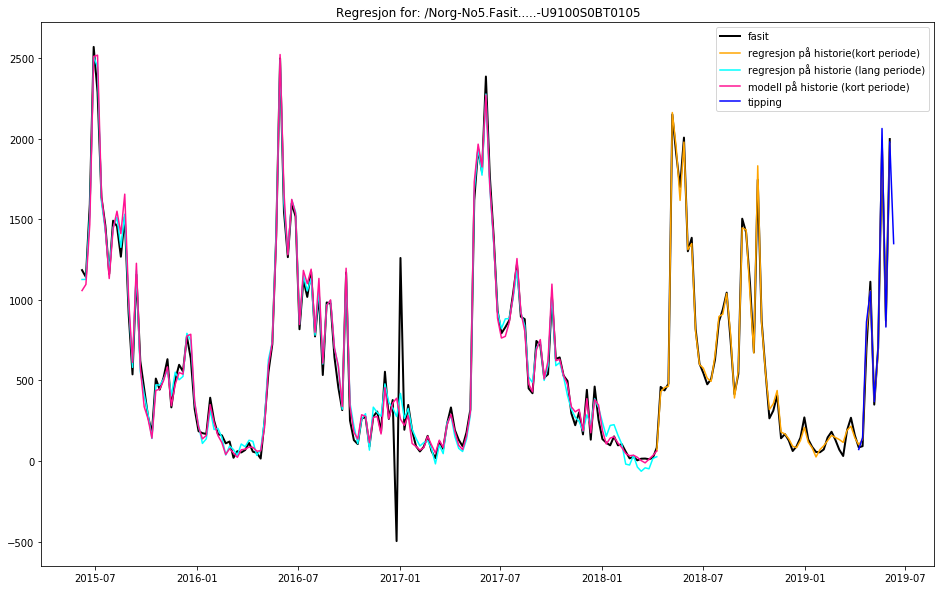

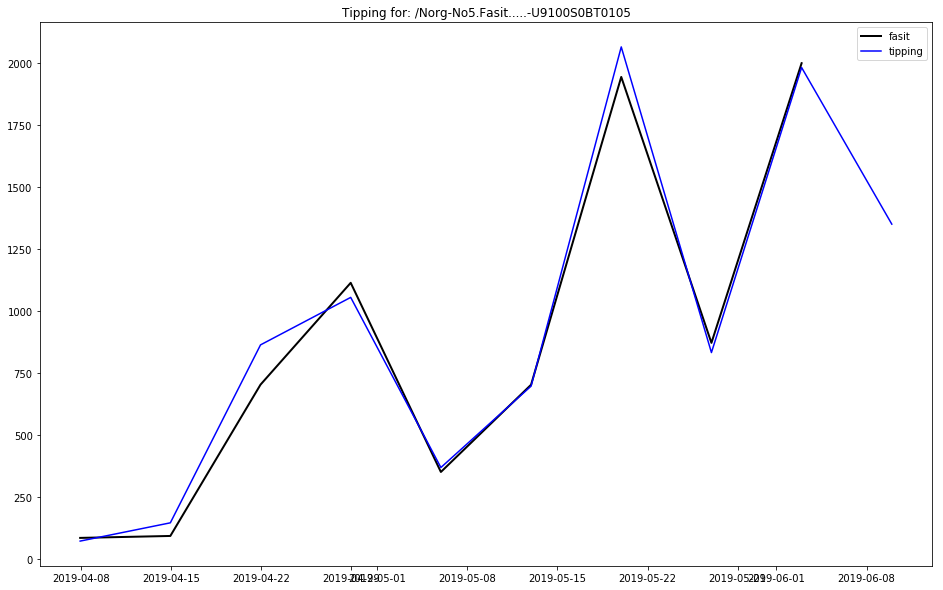

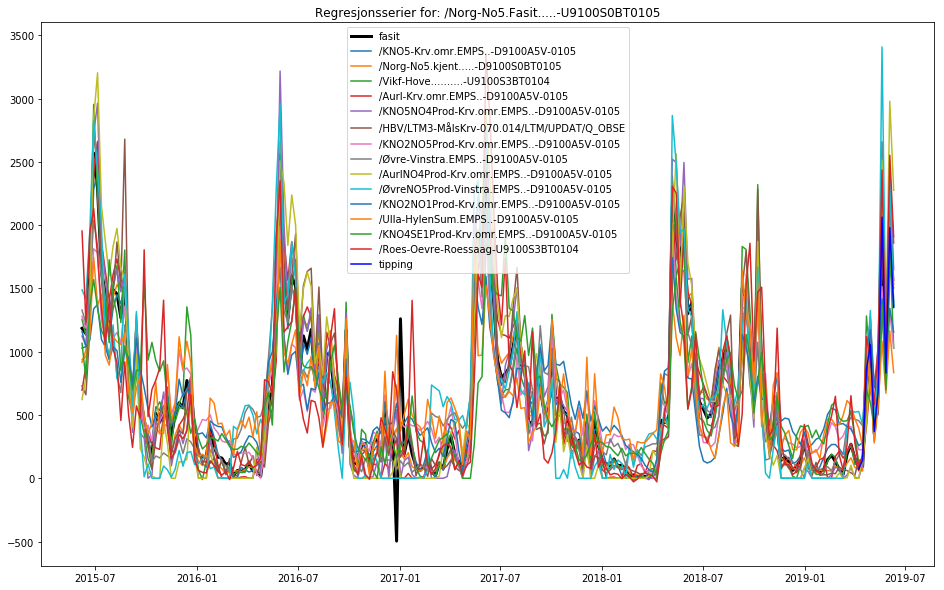



DEFAULT INPUT MAGASIN SE1 :
Antall utvalgte kandidater utifra korrelasjon med fasit (ant_kandidater):  40
Høyeste p-verdi som tas med i sluttmodellen (max_p):  0.025
Antall uker den "korte" regresjonen kjøres (reg_period):  60 


Skriver estimerte verdier til:  RegEstimatTilsigSE1-U9100S0BT0105
Skriver formel for siste regresjon til:  RegresjonTilsigSE1.-U9100S0BT0105

-----------------------------------------------------------------------
RESULTATER FOR /Sver-Se1.Fasit.....-U9100S0BT0105

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.06.03.
Regresjonsperiode brukt på modellen for siste tipping: 2018.04.09 til: 2019.06.03.
Valgte 40.00 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 7 stk.
Antall stopp av loopen som luker ut for høye p pga minimum antall serier i den lange regresjonen: 0/10
R2 for regresjonen (kort periode): 0.98880
R2 mellom fasit og tipping: 0.92701

Fasit:
 2019-05-13 00:00:0

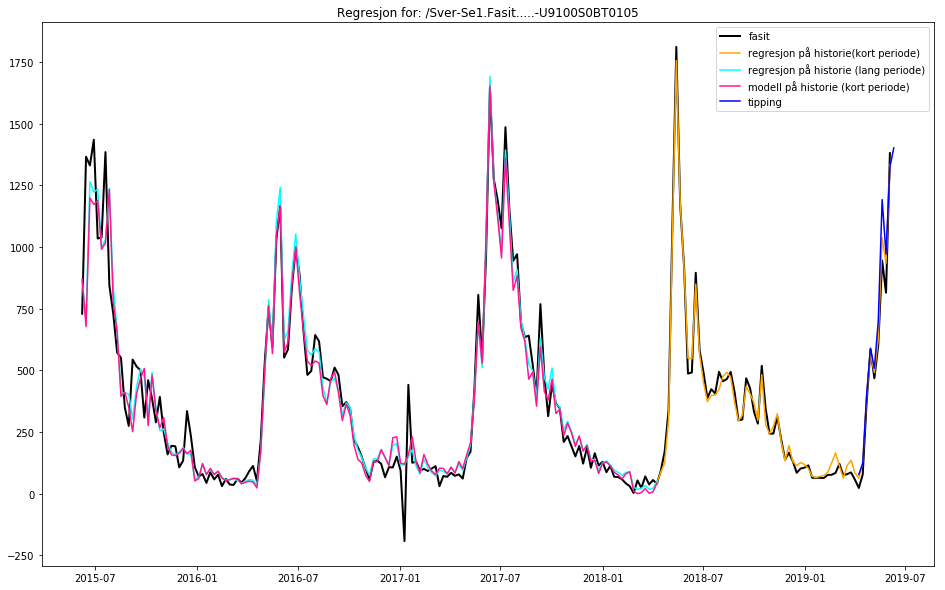

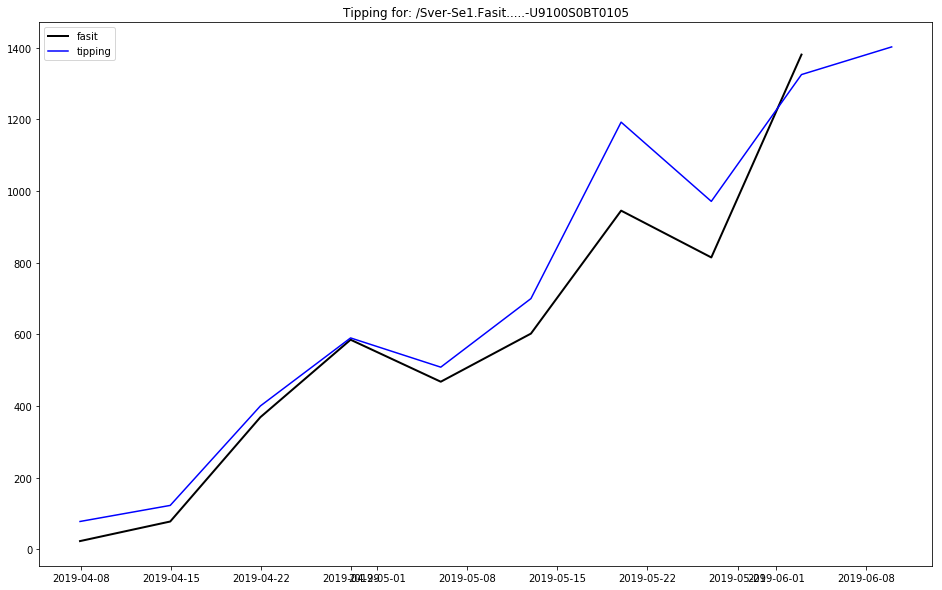

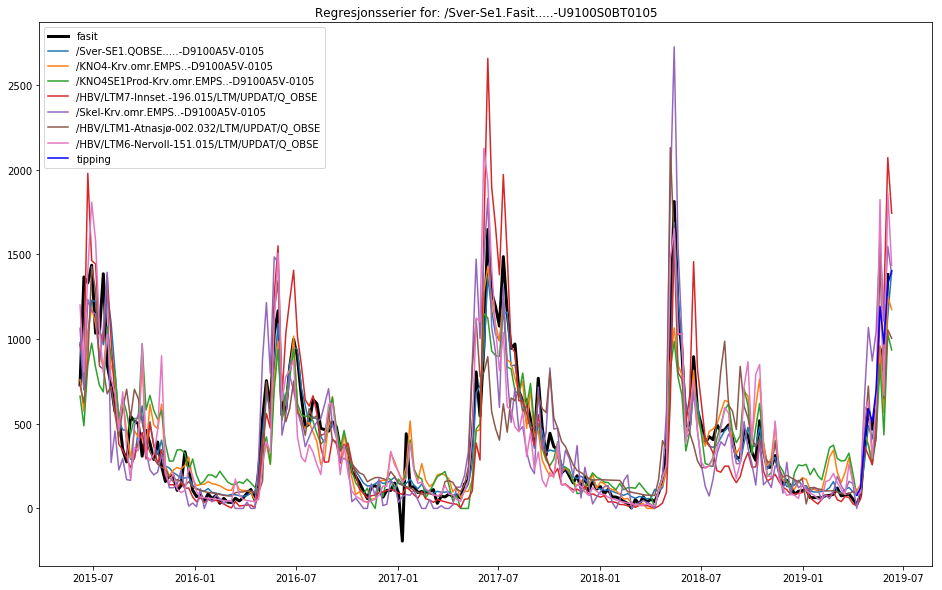



DEFAULT INPUT MAGASIN SE2 :
Antall utvalgte kandidater utifra korrelasjon med fasit (ant_kandidater):  170
Høyeste p-verdi som tas med i sluttmodellen (max_p):  0.025
Antall uker den "korte" regresjonen kjøres (reg_period):  90 


Skriver estimerte verdier til:  RegEstimatTilsigSE2-U9100S0BT0105
Skriver formel for siste regresjon til:  RegresjonTilsigSE2.-U9100S0BT0105

-----------------------------------------------------------------------
RESULTATER FOR /Sver-Se2.Fasit.....-U9100S0BT0105

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.06.03.
Regresjonsperiode brukt på modellen for siste tipping: 2017.09.11 til: 2019.06.03.
Valgte 170.00 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 24 stk.
Antall stopp av loopen som luker ut for høye p pga minimum antall serier i den lange regresjonen: 0/10
R2 for regresjonen (kort periode): 0.99941
R2 mellom fasit og tipping: 0.98509

Fasit:
 2019-05-13 00:0

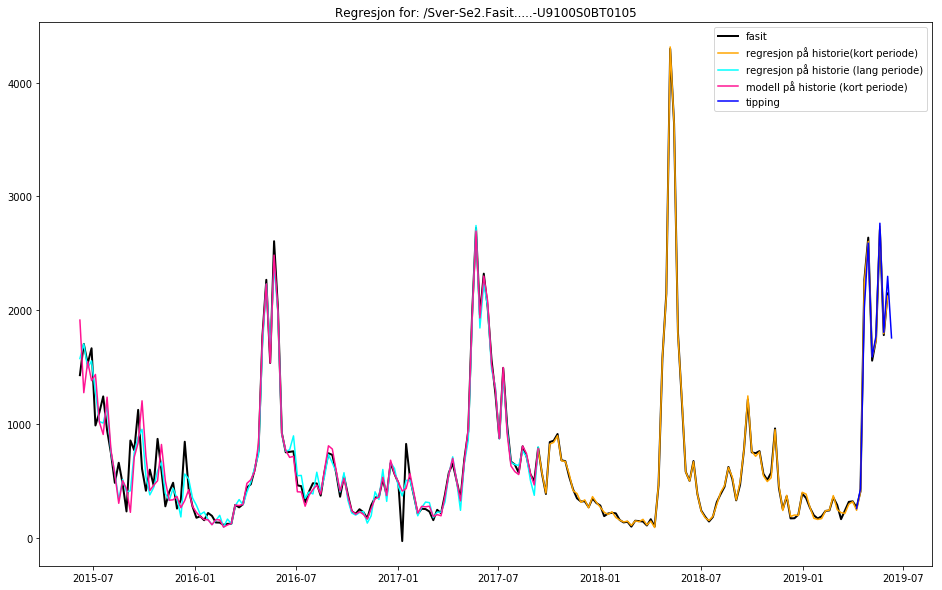

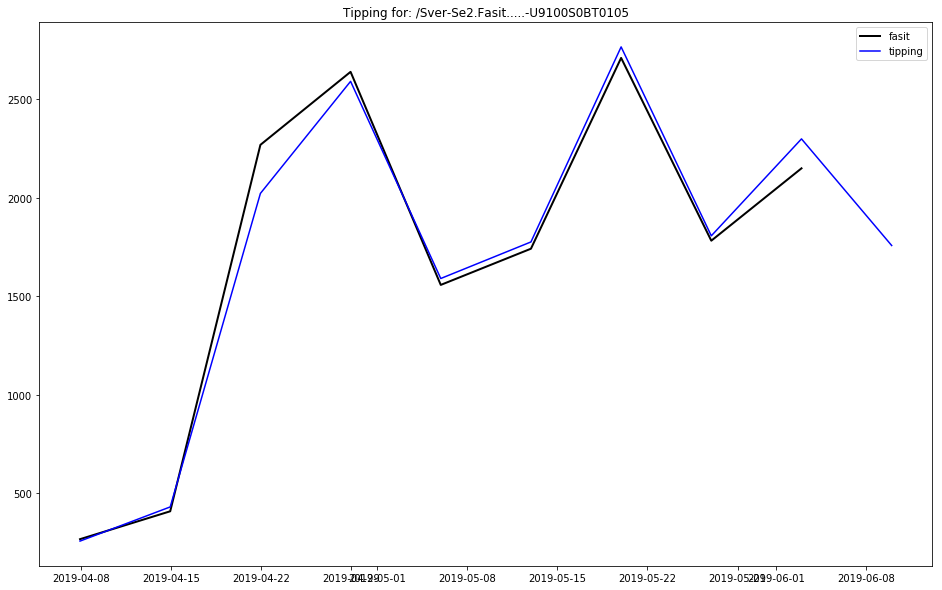

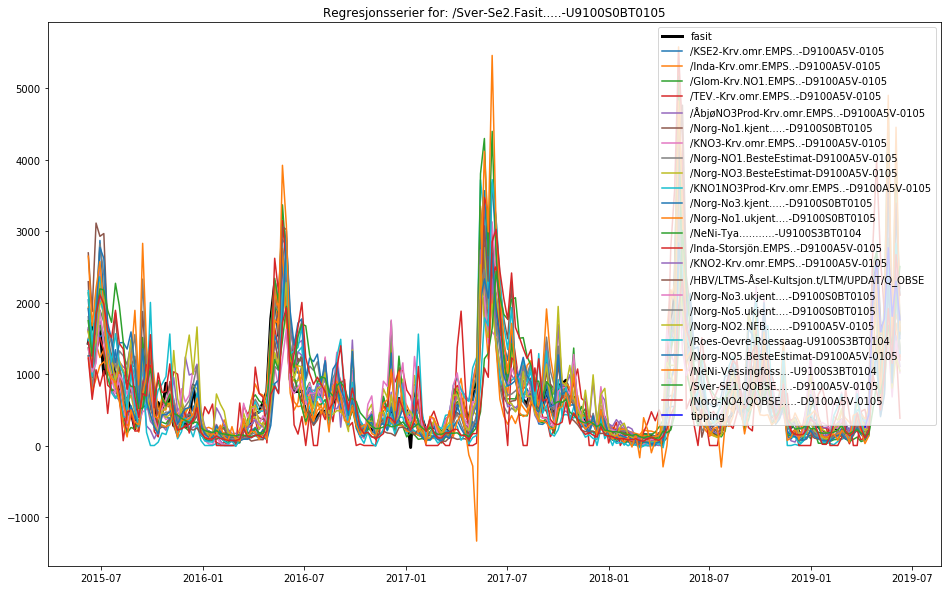



DEFAULT INPUT MAGASIN SE3 :
Antall utvalgte kandidater utifra korrelasjon med fasit (ant_kandidater):  146
Høyeste p-verdi som tas med i sluttmodellen (max_p):  0.025
Antall uker den "korte" regresjonen kjøres (reg_period):  60 


Skriver estimerte verdier til:  RegEstimatTilsigSE3-U9100S0BT0105
Skriver formel for siste regresjon til:  RegresjonTilsigSE3.-U9100S0BT0105

-----------------------------------------------------------------------
RESULTATER FOR /Sver-Se3.Fasit.....-U9100S0BT0105

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.06.03.
Regresjonsperiode brukt på modellen for siste tipping: 2018.04.09 til: 2019.06.03.
Valgte 146.00 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 23 stk.
Antall stopp av loopen som luker ut for høye p pga minimum antall serier i den lange regresjonen: 0/10
R2 for regresjonen (kort periode): 0.99124
R2 mellom fasit og tipping: 0.74970

Fasit:
 2019-05-13 00:0

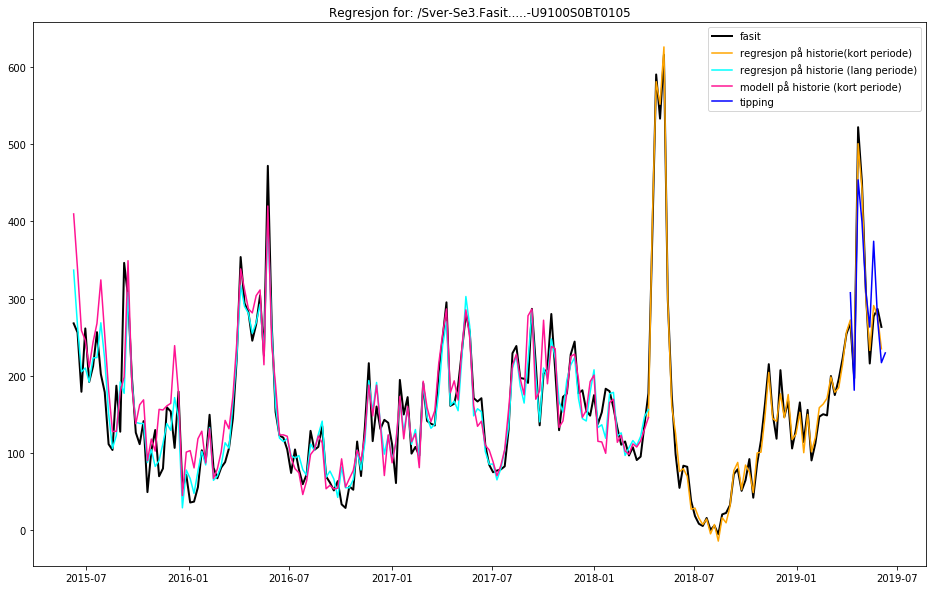

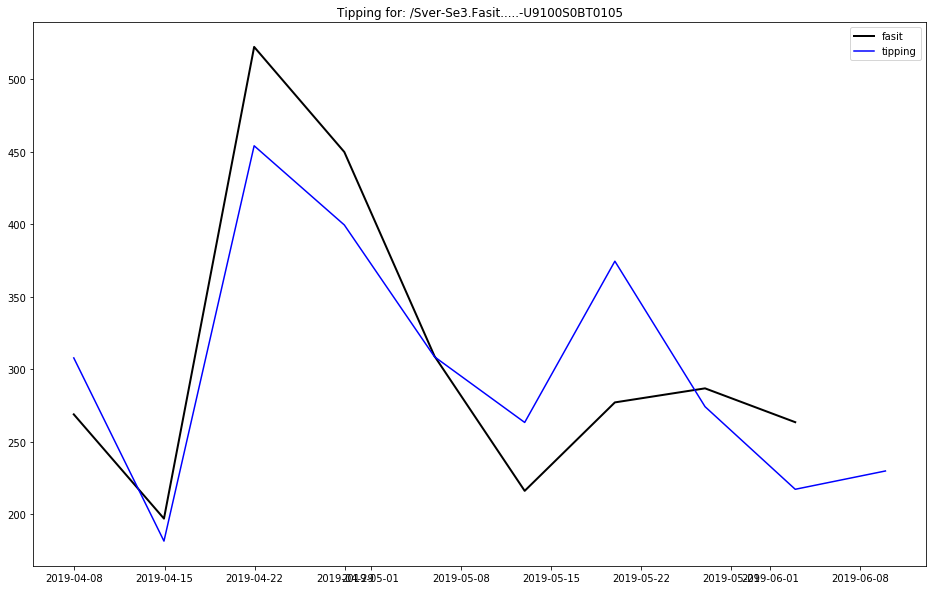

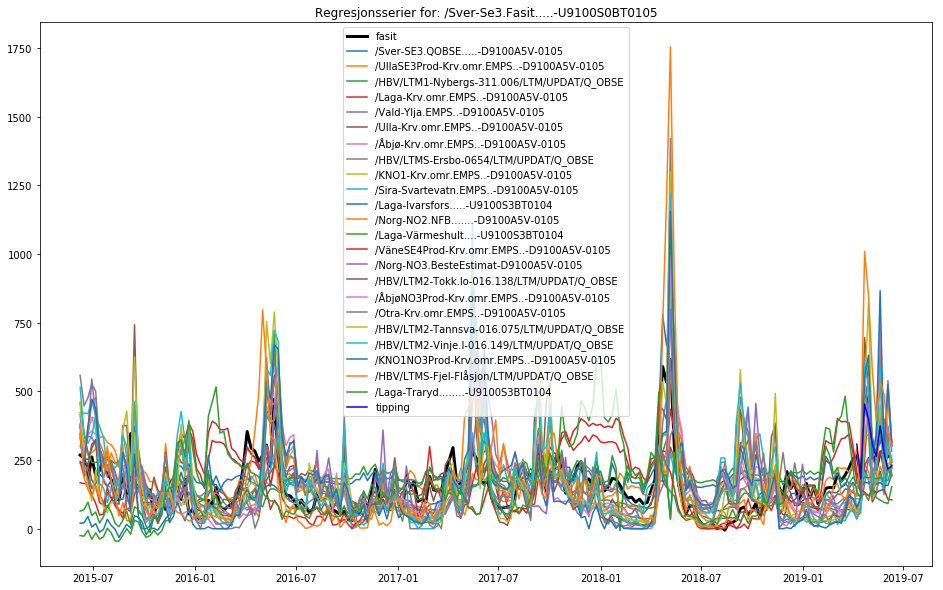



DEFAULT INPUT MAGASIN SE4 :
Antall utvalgte kandidater utifra korrelasjon med fasit (ant_kandidater):  40
Høyeste p-verdi som tas med i sluttmodellen (max_p):  0.025
Antall uker den "korte" regresjonen kjøres (reg_period):  90 


Skriver estimerte verdier til:  RegEstimatTilsigSE4-U9100S0BT0105
Skriver formel for siste regresjon til:  RegresjonTilsigSE4.-U9100S0BT0105

-----------------------------------------------------------------------
RESULTATER FOR /Sver-Se4.Fasit.....-U9100S0BT0105

Regresjonsperiode brukt til setup for siste tipping: 2015.06.08 til: 2019.06.03.
Regresjonsperiode brukt på modellen for siste tipping: 2017.09.11 til: 2019.06.03.
Valgte 40.00 kandidater til regresjonen utifra korrelasjon med fasitserien.
Valgte så ut de med p-value < 0.02500, som var 11 stk.
Antall stopp av loopen som luker ut for høye p pga minimum antall serier i den lange regresjonen: 0/10
R2 for regresjonen (kort periode): 0.99052
R2 mellom fasit og tipping: 0.22931

Fasit:
 2019-05-13 00:00:

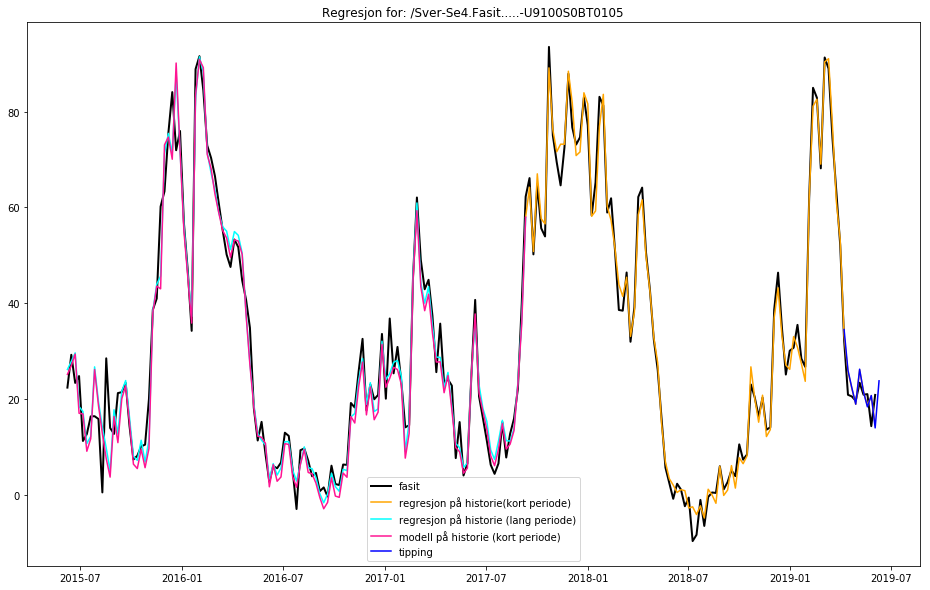

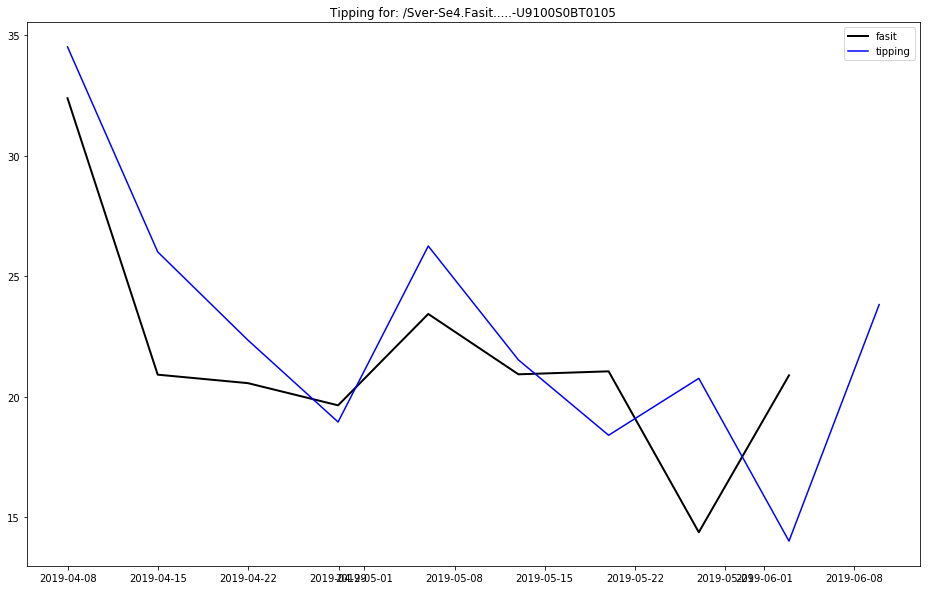

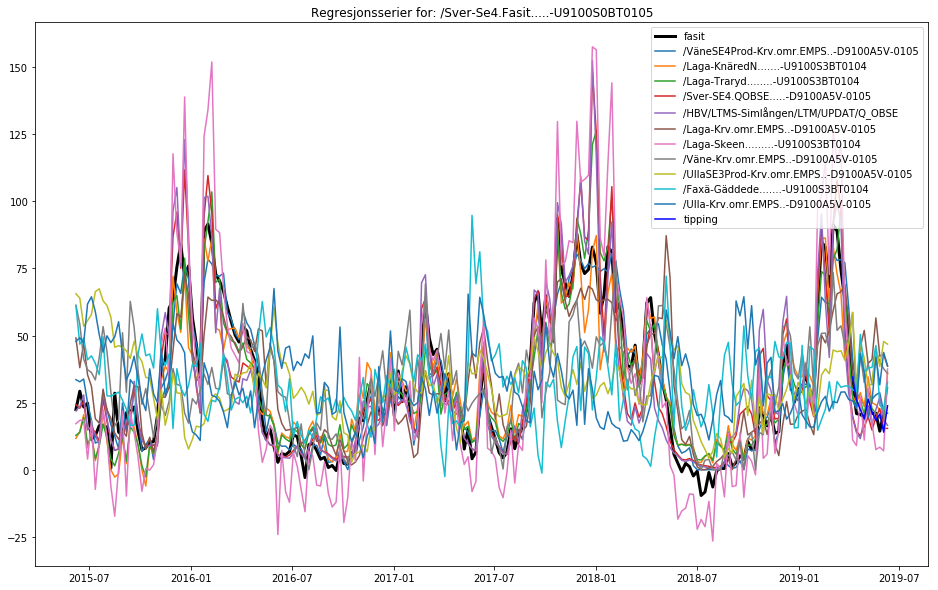

In [2]:
var = ['magasin','tilsig']
reg = ['NO1','NO2','NO3','NO4','NO5','SE1','SE2','SE3','SE4']
for variable in var:
    for region in reg:
        show_result_input = make_estimate_and_write(variable, region, auto_input[variable])
        show_result(show_result_input)